# Vlerick use case : optimizing distribution policies

## Part 2. Demand Forecasting

---

In [1]:
from google.colab import drive
drive.mount ('/content/drive')

Mounted at /content/drive


In [2]:
import os
import io
import sys
import glob
import copy
import warnings
import statistics
from datetime import timedelta
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error

import gym
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import clear_output
from statsmodels.tsa.arima.model import ARIMA

%matplotlib inline

In [3]:
import sys
sys.path.append('/content/drive/MyDrive/Hackathons/Vlerick')
from custom_objects import *


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Data

In [4]:
df = pd.read_pickle('/content/drive/MyDrive/Hackathons/Vlerick/vlerick.pkl')
# df = pd.read_pickle('/content/vlerick.pkl')
df

Description  \
Material Plant Date                                                            
62003310 B124  2023-09-12  DBramante recycled Magsafe cover Monaco - blac...   
               2023-09-13  DBramante recycled Magsafe cover Monaco - blac...   
               2023-09-14  DBramante recycled Magsafe cover Monaco - blac...   
               2023-09-15  DBramante recycled Magsafe cover Monaco - blac...   
               2023-09-16  DBramante recycled Magsafe cover Monaco - blac...   
...                                                                      ...   
64641022 T942  2024-03-25                         Xiaomi 13T Pro 512GB Black   
               2024-03-26                         Xiaomi 13T Pro 512GB Black   
               2024-03-27                         Xiaomi 13T Pro 512GB Black   
               2024-03-28                         Xiaomi 13T Pro 512GB Black   
               2024-03-29                         Xiaomi 13T Pro 512GB Black   

                                      Type  Supply  Demand   Price  \
Material Plant Date                                                  
62003310 B124  2023-09-12  Accessories A&C   363.0     0.0   29.99   
               2023-09-13  Accessories A&C     0.0     0.0   29.99   
               2023-09-14  Accessories A&C     0.0     0.0   29.99   
               2023-09-15  Accessories A&C     0.0     0.0   29.99   
               2023-09-16  Accessories A&C     0.0     0.0   29.99   
...                                    ...     ...     ...     ...   
64641022 T942  2024-03-25           Mobile     0.0     0.0  799.99   
               2024-03-26           Mobile     0.0     0.0  799.99   
               2024-03-27           Mobile     0.0     0.0  799.99   
               2024-03-28           Mobile     0.0     0.0  799.99   
               2024-03-29           Mobile     0.0     0.0  799.99   

                                     Status  Current_month_forecast  \
Material Plant Date                                                   
62003310 B124  2023-09-12  Ready for Launch                   250.0   
               2023-09-13  Ready for Launch                   250.0   
               2023-09-14  Ready for Launch                   250.0   
               2023-09-15  Ready for Launch                   250.0   
               2023-09-16  Ready for Launch                   250.0   
...                                     ...                     ...   
64641022 T942  2024-03-25          Maturity                   100.0   
               2024-03-26          Maturity                   100.0   
               2024-03-27          Maturity                   100.0   
               2024-03-28          Maturity                   100.0   
               2024-03-29          Maturity                   100.0   

                           Daily_forecast Hist_method  Hist_activity  \
Material Plant Date                                                    
62003310 B124  2023-09-12            0.10       NEVER          21.31   
               2023-09-13            0.10        AUTO          14.04   
               2023-09-14            0.11        AUTO          14.04   
               2023-09-15            0.11        AUTO          14.73   
               2023-09-16            0.11        AUTO          14.73   
...                                   ...         ...            ...   
64641022 T942  2024-03-25            0.04        AUTO          15.84   
               2024-03-26            0.03        AUTO          15.80   
               2024-03-27            0.03        AUTO          15.19   
               2024-03-28            0.03        AUTO          14.73   
               2024-03-29            0.03        AUTO          14.58   

                           Hist_shop_stock  Hist_supplier_stock  Hist_sales  
Material Plant Date                                                          
62003310 B124  2023-09-12              0.0                350.0           0  
               202

In [ ]:
df.columns

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['Description', 'Type', 'Supply', 'Demand', 'Price', 'Status',
       'Current_month_forecast', 'Daily_forecast', 'Hist_method',
       'Hist_activity', 'Hist_shop_stock', 'Hist_supplier_stock',
       'Hist_sales'],
      dtype='object')

In [6]:
df_reset = df.reset_index()

df_reset

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Material,Plant,Date,Description,Type,Supply,Demand,Price,Status,Current_month_forecast,Daily_forecast,Hist_method,Hist_activity,Hist_shop_stock,Hist_supplier_stock,Hist_sales
0,62003310,B124,2023-09-12,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,363.0,0.0,29.99,Ready for Launch,250.0,0.10,NEVER,21.31,0.0,350.0,0
1,62003310,B124,2023-09-13,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.10,AUTO,14.04,0.0,350.0,0
2,62003310,B124,2023-09-14,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.04,2.0,150.0,0
3,62003310,B124,2023-09-15,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.73,2.0,150.0,0
4,62003310,B124,2023-09-16,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.73,2.0,150.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154174,64641022,T942,2024-03-25,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.04,AUTO,15.84,1.0,50.0,0
154175,64641022,T942,2024-03-26,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,15.80,1.0,47.0,0
154176,64641022,T942,2024-03-27,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,15.19,1.0,40.0,0
154177,64641022,T942,2024-03-28,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,14.73,1.0,39.0,0


## EDA

<Axes: >

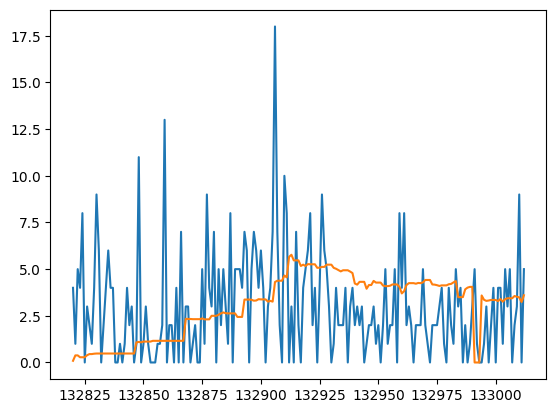

In [ ]:
x=df.reset_index()
x[(x.Material==64640219) & (x.Plant=='T412')].Demand.plot()
x[(x.Material==64640219) & (x.Plant=='T412')].Daily_forecast.plot()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


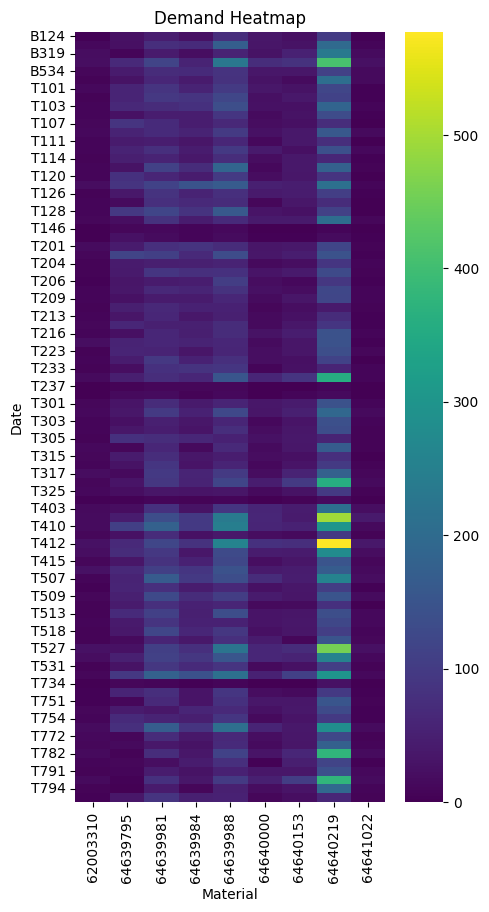

In [ ]:
import seaborn as sns

df['Volume'] = df['Demand'] * df['Price']
df_date = df.reset_index(level=2)
df_pivot = df_date.pivot_table(index='Plant', columns=['Material'], values='Demand', aggfunc='sum')

plt.figure(figsize=(5,10))
sns.heatmap(df_pivot, cmap='viridis')  # Create the heatmap using the 'coolwarm' colormap
plt.title('Demand Heatmap')  # Set the title of the heatmap
plt.xlabel('Material')  # Set the label for the x-axis
plt.ylabel('Date')  # Set the label for the y-axis
plt.show()  # Show the heatmap

### Calculate demand contribution per material per shops

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: xlabel='Plant', ylabel='Contribution'>

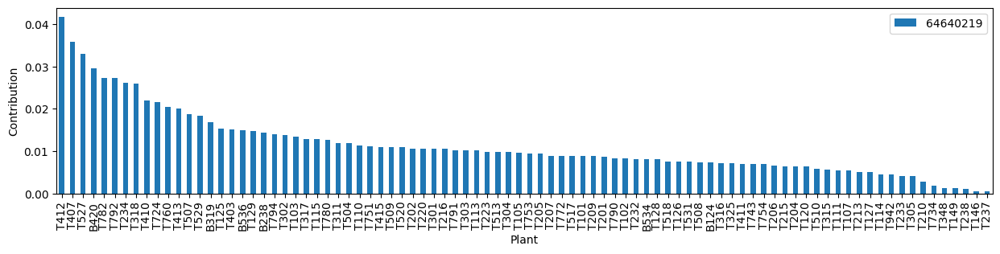

In [ ]:
material = 64640219
df_material = df_pivot[material]
df_contribution = pd.DataFrame(df_material/df_material.sum()).sort_values(by=material, ascending=False)

# plt.figure(figsize=(15,3))
df_contribution.plot.bar(figsize=(15,3), ylabel='Contribution')

In [ ]:
materials = [64639984, 64640000, 64640153, 64640219, 64641022, 64639981,
             64639988, 64639795, 62003310]

dfs = []
for material in materials:
    df_material = df_pivot[material]
    df_contribution = pd.DataFrame(df_material / df_material.sum(), columns=[material])
    dfs.append(df_contribution)

# Concatenate the list of DataFrames into a single DataFrame
df_contribution = pd.concat(dfs, axis=1)

df_contribution

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,64639984,64640000,64640153,64640219,64641022,64639981,64639988,64639795,62003310
Plant,,,,,,,,,
B124,0.005943,0.013748,0.007540,0.007254,0.005208,0.006938,0.009096,0.007631,0.003480
B238,0.014968,0.013344,0.008797,0.014363,0.010417,0.011463,0.020619,0.006783,0.013921
B319,0.004843,0.011727,0.016965,0.016902,0.023438,0.006184,0.006792,0.002544,0.022042
B420,0.012107,0.029519,0.026076,0.029597,0.029948,0.017647,0.027774,0.018937,0.024362
B534,0.014968,0.014153,0.011310,0.008125,0.019531,0.010558,0.010188,0.011588,0.011601
...,...,...,...,...,...,...,...,...,...
T790,0.009685,0.001213,0.015394,0.008342,0.003906,0.003167,0.009339,0.002826,0.008121
T791,0.006163,0.013748,0.010682,0.010229,0.016927,0.006637,0.006549,0.002544,0.005800
T792,0.007924,0.020218,0.032045,0.027349,0.020833,0.012066,0.012007,0.000848,0.016241


In [ ]:
dfc = df_date.pivot_table(index='Status', columns=['Material', 'Plant'], values='Demand', aggfunc=[np.max])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df_reset = df.reset_index()

df_reset

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Material,Plant,Date,Description,Type,Supply,Demand,Price,Status,Current_month_forecast,Daily_forecast,Hist_method,Hist_activity,Hist_shop_stock,Hist_supplier_stock,Hist_sales,Volume
0,62003310,B124,2023-09-12,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,363.0,0.0,29.99,Ready for Launch,250.0,0.10,NEVER,21.31,0.0,350.0,0,0.0
1,62003310,B124,2023-09-13,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.10,AUTO,14.04,0.0,350.0,0,0.0
2,62003310,B124,2023-09-14,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.04,2.0,150.0,0,0.0
3,62003310,B124,2023-09-15,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.73,2.0,150.0,0,0.0
4,62003310,B124,2023-09-16,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.73,2.0,150.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154174,64641022,T942,2024-03-25,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.04,AUTO,15.84,1.0,50.0,0,0.0
154175,64641022,T942,2024-03-26,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,15.80,1.0,47.0,0,0.0
154176,64641022,T942,2024-03-27,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,15.19,1.0,40.0,0,0.0
154177,64641022,T942,2024-03-28,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,14.73,1.0,39.0,0,0.0


### Treemap

In [ ]:
# Create a dictionary mapping material numbers to item names
item_names = {
    62003310: "Black Cover",
    64639795: "Doro 6060 Black/White",
    64639981: "Samsung Galaxy A14",
    64639984: "Samsung A34",
    64639988: "Samsung A54",
    64640000: "iPhone 12",
    64640153: "iPhone 14",
    64640219: "iPhone 15",
    64641022: "Xiaomi 13T"
}

# Assuming 'df' has a 'Material' column with numeric IDs
df_reset['Item'] = df_reset['Material'].map(item_names)

# Handle potential missing values (if 'Material' has values not in 'item_names')
df_reset['Item'] = df_reset['Material'].map(item_names).fillna("Unknown")
df_reset

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Material,Plant,Date,Description,Type,Supply,Demand,Price,Status,Current_month_forecast,Daily_forecast,Hist_method,Hist_activity,Hist_shop_stock,Hist_supplier_stock,Hist_sales,Volume,Item
0,62003310,B124,2023-09-12,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,363.0,0.0,29.99,Ready for Launch,250.0,0.10,NEVER,21.31,0.0,350.0,0,0.0,Black Cover
1,62003310,B124,2023-09-13,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.10,AUTO,14.04,0.0,350.0,0,0.0,Black Cover
2,62003310,B124,2023-09-14,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.04,2.0,150.0,0,0.0,Black Cover
3,62003310,B124,2023-09-15,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.73,2.0,150.0,0,0.0,Black Cover
4,62003310,B124,2023-09-16,DBramante recycled Magsafe cover Monaco - blac...,Accessories A&C,0.0,0.0,29.99,Ready for Launch,250.0,0.11,AUTO,14.73,2.0,150.0,0,0.0,Black Cover
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154174,64641022,T942,2024-03-25,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.04,AUTO,15.84,1.0,50.0,0,0.0,Xiaomi 13T
154175,64641022,T942,2024-03-26,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,15.80,1.0,47.0,0,0.0,Xiaomi 13T
154176,64641022,T942,2024-03-27,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,15.19,1.0,40.0,0,0.0,Xiaomi 13T
154177,64641022,T942,2024-03-28,Xiaomi 13T Pro 512GB Black,Mobile,0.0,0.0,799.99,Maturity,100.0,0.03,AUTO,14.73,1.0,39.0,0,0.0,Xiaomi 13T


In [ ]:
import plotly.express as px

# df = px.data.tips()

fig = px.treemap(df_reset, path=['Item', 'Plant'],
                 values='Demand')

# Enlarging the figure size
fig.update_layout(width=1000, height=600)

fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Clustering product

### Calculate the sum of demand per material

In [7]:
df_sum_demand = pd.DataFrame(df_reset.groupby(['Material']).Demand.sum())

df_sum_demand

,Demand
Material,
62003310,862.0
64639795,3538.0
64639981,6630.0
64639984,4543.0
64639988,8245.0
64640000,2473.0
64640153,3183.0
64640219,13785.0
64641022,768.0


### Make pivot table of demand with date

In [8]:
df_date = df.reset_index(level=2)
dfx = df_date.pivot_table(index='Date', columns=['Material'], values='Demand', aggfunc='sum')

monthly_avg_demand = dfx.resample('D').sum().transpose()

monthly_avg_demand

Date,2023-09-01,2023-09-02,2023-09-03,2023-09-04,2023-09-05,2023-09-06,2023-09-07,2023-09-08,2023-09-09,2023-09-10,...,2024-03-20,2024-03-21,2024-03-22,2024-03-23,2024-03-24,2024-03-25,2024-03-26,2024-03-27,2024-03-28,2024-03-29
Material,,,,,,,,,,,,,,,,,,,,,
62003310,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,5.0,8.0,9.0,0.0,2.0,2.0,2.0,4.0,4.0
64639795,19.0,26.0,0.0,26.0,23.0,24.0,16.0,18.0,16.0,0.0,...,15.0,24.0,18.0,16.0,0.0,22.0,18.0,11.0,11.0,17.0
64639981,53.0,44.0,0.0,51.0,31.0,48.0,34.0,34.0,49.0,0.0,...,24.0,9.0,5.0,13.0,0.0,14.0,12.0,2.0,7.0,3.0
64639984,35.0,49.0,0.0,30.0,35.0,23.0,33.0,29.0,42.0,0.0,...,9.0,11.0,6.0,4.0,0.0,3.0,5.0,2.0,3.0,3.0
64639988,43.0,77.0,0.0,52.0,44.0,40.0,46.0,54.0,50.0,0.0,...,18.0,6.0,8.0,8.0,0.0,3.0,3.0,3.0,3.0,5.0
64640000,3.0,13.0,0.0,18.0,8.0,12.0,11.0,16.0,13.0,0.0,...,10.0,6.0,1.0,10.0,0.0,4.0,5.0,10.0,6.0,8.0
64640153,41.0,40.0,0.0,43.0,28.0,54.0,65.0,45.0,51.0,0.0,...,11.0,8.0,10.0,8.0,0.0,7.0,6.0,9.0,11.0,8.0
64640219,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,77.0,79.0,99.0,127.0,0.0,86.0,52.0,83.0,100.0,107.0
64641022,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,1.0,2.0,6.0,0.0,2.0,6.0,5.0,3.0,0.0


### Calculate normalized demand

$$D(t)_{norm}=\frac{D(t)}{\sum D}$$

In [9]:
z=monthly_avg_demand.divide(df_sum_demand.Demand, axis=0)

z

Date,2023-09-01,2023-09-02,2023-09-03,2023-09-04,2023-09-05,2023-09-06,2023-09-07,2023-09-08,2023-09-09,2023-09-10,...,2024-03-20,2024-03-21,2024-03-22,2024-03-23,2024-03-24,2024-03-25,2024-03-26,2024-03-27,2024-03-28,2024-03-29
Material,,,,,,,,,,,,,,,,,,,,,
62003310,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.002320,0.005800,0.009281,0.010441,0.0,0.002320,0.002320,0.002320,0.004640,0.004640
64639795,0.005370,0.007349,0.0,0.007349,0.006501,0.006783,0.004522,0.005088,0.004522,0.0,...,0.004240,0.006783,0.005088,0.004522,0.0,0.006218,0.005088,0.003109,0.003109,0.004805
64639981,0.007994,0.006637,0.0,0.007692,0.004676,0.007240,0.005128,0.005128,0.007391,0.0,...,0.003620,0.001357,0.000754,0.001961,0.0,0.002112,0.001810,0.000302,0.001056,0.000452
64639984,0.007704,0.010786,0.0,0.006604,0.007704,0.005063,0.007264,0.006383,0.009245,0.0,...,0.001981,0.002421,0.001321,0.000880,0.0,0.000660,0.001101,0.000440,0.000660,0.000660
64639988,0.005215,0.009339,0.0,0.006307,0.005337,0.004851,0.005579,0.006549,0.006064,0.0,...,0.002183,0.000728,0.000970,0.000970,0.0,0.000364,0.000364,0.000364,0.000364,0.000606
64640000,0.001213,0.005257,0.0,0.007279,0.003235,0.004852,0.004448,0.006470,0.005257,0.0,...,0.004044,0.002426,0.000404,0.004044,0.0,0.001617,0.002022,0.004044,0.002426,0.003235
64640153,0.012881,0.012567,0.0,0.013509,0.008797,0.016965,0.020421,0.014138,0.016023,0.0,...,0.003456,0.002513,0.003142,0.002513,0.0,0.002199,0.001885,0.002828,0.003456,0.002513
64640219,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.005586,0.005731,0.007182,0.009213,0.0,0.006239,0.003772,0.006021,0.007254,0.007762
64641022,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.005208,0.001302,0.002604,0.007812,0.0,0.002604,0.007812,0.006510,0.003906,0.000000


In [10]:
z = z.reset_index()
print(z[z.isnull().any(axis=1)])

Empty DataFrame
Columns: [Material, 2023-09-01 00:00:00, 2023-09-02 00:00:00, 2023-09-03 00:00:00, 2023-09-04 00:00:00, 2023-09-05 00:00:00, 2023-09-06 00:00:00, 2023-09-07 00:00:00, 2023-09-08 00:00:00, 2023-09-09 00:00:00, 2023-09-10 00:00:00, 2023-09-11 00:00:00, 2023-09-12 00:00:00, 2023-09-13 00:00:00, 2023-09-14 00:00:00, 2023-09-15 00:00:00, 2023-09-16 00:00:00, 2023-09-17 00:00:00, 2023-09-18 00:00:00, 2023-09-19 00:00:00, 2023-09-20 00:00:00, 2023-09-21 00:00:00, 2023-09-22 00:00:00, 2023-09-23 00:00:00, 2023-09-24 00:00:00, 2023-09-25 00:00:00, 2023-09-26 00:00:00, 2023-09-27 00:00:00, 2023-09-28 00:00:00, 2023-09-29 00:00:00, 2023-09-30 00:00:00, 2023-10-01 00:00:00, 2023-10-02 00:00:00, 2023-10-03 00:00:00, 2023-10-04 00:00:00, 2023-10-05 00:00:00, 2023-10-06 00:00:00, 2023-10-07 00:00:00, 2023-10-08 00:00:00, 2023-10-09 00:00:00, 2023-10-10 00:00:00, 2023-10-11 00:00:00, 2023-10-12 00:00:00, 2023-10-13 00:00:00, 2023-10-14 00:00:00, 2023-10-15 00:00:00, 2023-10-16 00:00:00

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [11]:
z.dropna(inplace=True)
z.columns = z.columns.astype(str)
z.columns

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['Material', '2023-09-01 00:00:00', '2023-09-02 00:00:00',
       '2023-09-03 00:00:00', '2023-09-04 00:00:00', '2023-09-05 00:00:00',
       '2023-09-06 00:00:00', '2023-09-07 00:00:00', '2023-09-08 00:00:00',
       '2023-09-09 00:00:00',
       ...
       '2024-03-20 00:00:00', '2024-03-21 00:00:00', '2024-03-22 00:00:00',
       '2024-03-23 00:00:00', '2024-03-24 00:00:00', '2024-03-25 00:00:00',
       '2024-03-26 00:00:00', '2024-03-27 00:00:00', '2024-03-28 00:00:00',
       '2024-03-29 00:00:00'],
      dtype='object', name='Date', length=212)

In [12]:
z_smartphones = z[~z['Material'].isin([62003310, 64639795])]
z_blockphone = z[z['Material'].isin([64639795])]
z_covers = z[z['Material'].isin([62003310])]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [13]:
z_smartphone_clustering = z_smartphones.drop(columns = ['Material'])
z_blockphone_clustering = z_blockphone.drop(columns = ['Material'])
z_covers_clustering = z_covers.drop(columns = ['Material'])

### KMeans clustering

In [14]:
def find_optimal_clusters(data, max_k):
    inertias = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertias.append(kmeans.inertia_)
    return inertias

def find_elbow_point(inertias):
    # Compute the differences between successive inertia values
    differences = np.diff(inertias)
    # Find the point of maximum curvature
    elbow_index = np.argmax(differences) + 1
    return elbow_index

import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

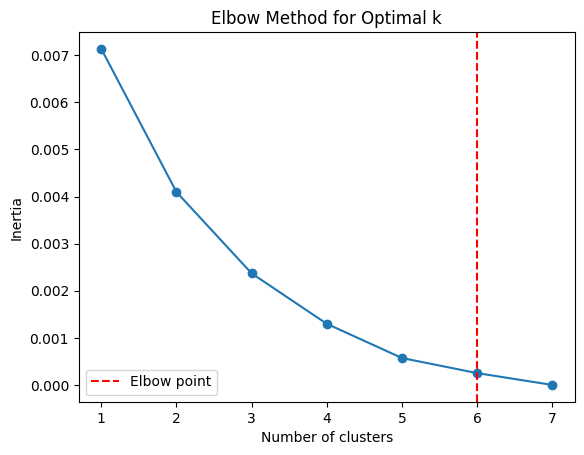

In [15]:
# Find the inertia for each number of clusters
inertias = find_optimal_clusters(z_smartphone_clustering, 7)

# Find the index of the elbow point
elbow_index = find_elbow_point(inertias)

# Plot the inertia curve
plt.plot(range(1, 7 + 1), inertias, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.axvline(x=elbow_index, color='r', linestyle='--', label='Elbow point')
plt.legend()
plt.show()

In [16]:
kmeans = KMeans(n_clusters = elbow_index, init = 'k-means++', random_state = 1, n_init=10)
kmeans.fit(z_smartphone_clustering)

z_smartphones['Cluster'] = kmeans.labels_

In [17]:
sales_df = z_smartphones.T
sales_df.columns = sales_df.iloc[0]

# Drop the first row
sales_df = sales_df[1:]

sales_df.columns = sales_df.columns.astype(str)
sales_df['Cluster 5_64639981_6463998'] = sales_df[['64639981.0', '64639988.0']].mean(axis=1)
sales_df = sales_df.reset_index()
sales_df = sales_df[:-1]
sales_df = sales_df.drop(columns = ['64639981.0', '64639988.0'])
sales_df

Material,Date,64639984.0,64640000.0,64640153.0,64640219.0,64641022.0,Cluster 5_64639981_6463998
0,2023-09-01 00:00:00,0.007704,0.001213,0.012881,0.000000,0.000000,0.006605
1,2023-09-02 00:00:00,0.010786,0.005257,0.012567,0.000000,0.000000,0.007988
2,2023-09-03 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,2023-09-04 00:00:00,0.006604,0.007279,0.013509,0.000000,0.000000,0.007000
4,2023-09-05 00:00:00,0.007704,0.003235,0.008797,0.000000,0.000000,0.005006
...,...,...,...,...,...,...,...
206,2024-03-25 00:00:00,0.000660,0.001617,0.002199,0.006239,0.002604,0.001238
207,2024-03-26 00:00:00,0.001101,0.002022,0.001885,0.003772,0.007812,0.001087
208,2024-03-27 00:00:00,0.000440,0.004044,0.002828,0.006021,0.006510,0.000333
209,2024-03-28 00:00:00,0.000660,0.002426,0.003456,0.007254,0.003906,0.000710


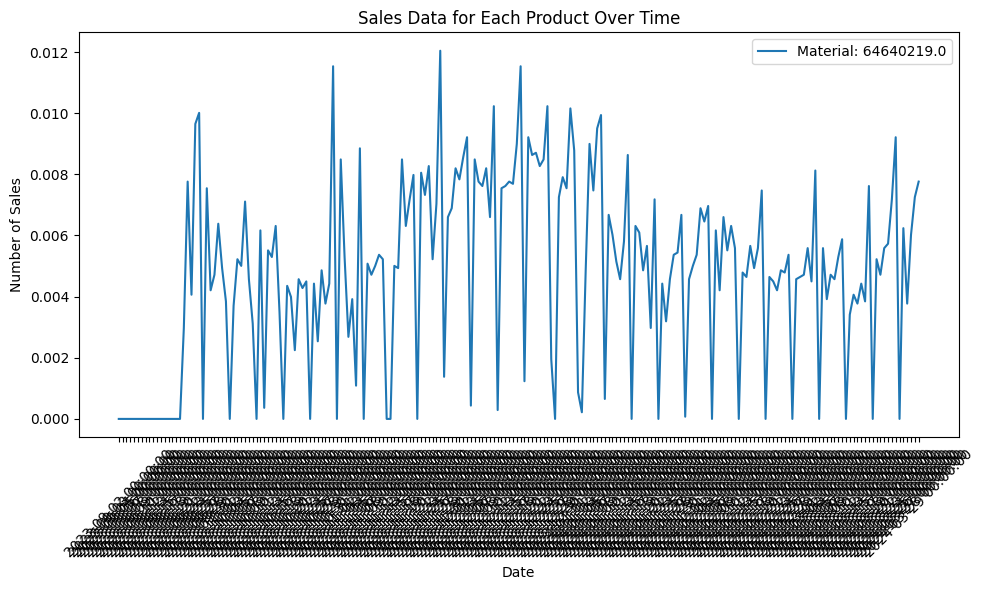

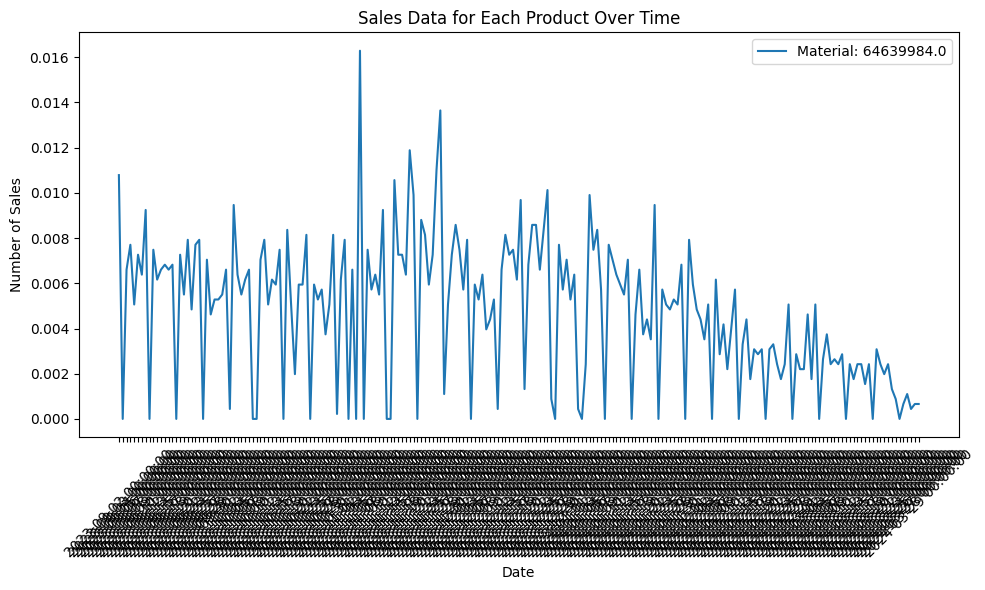

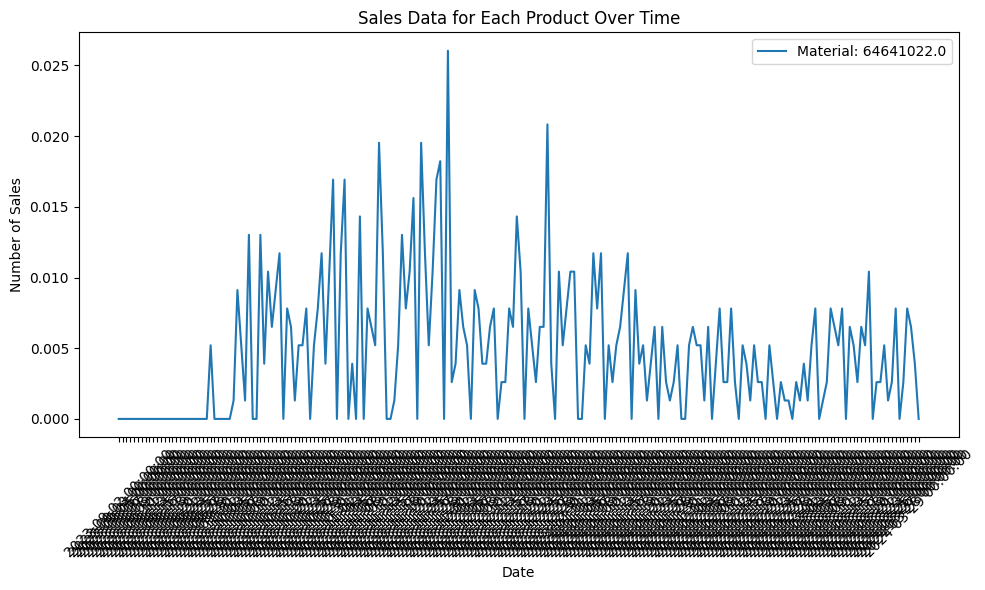

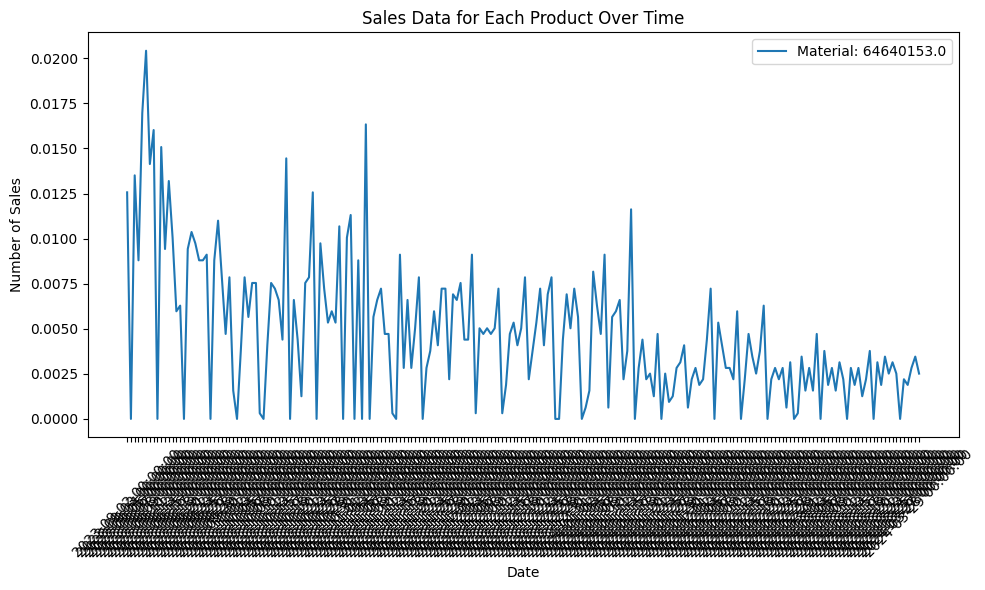

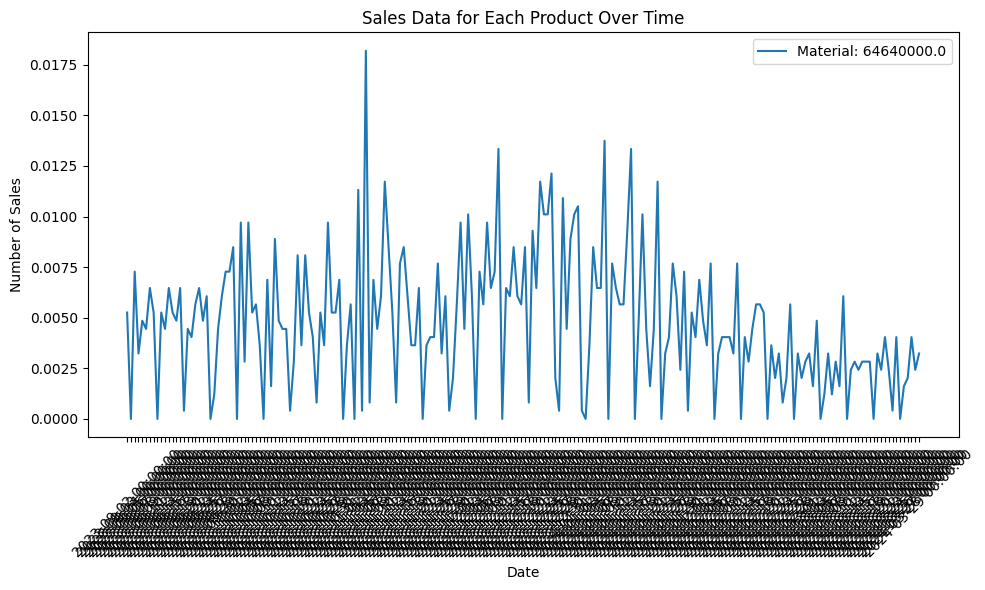

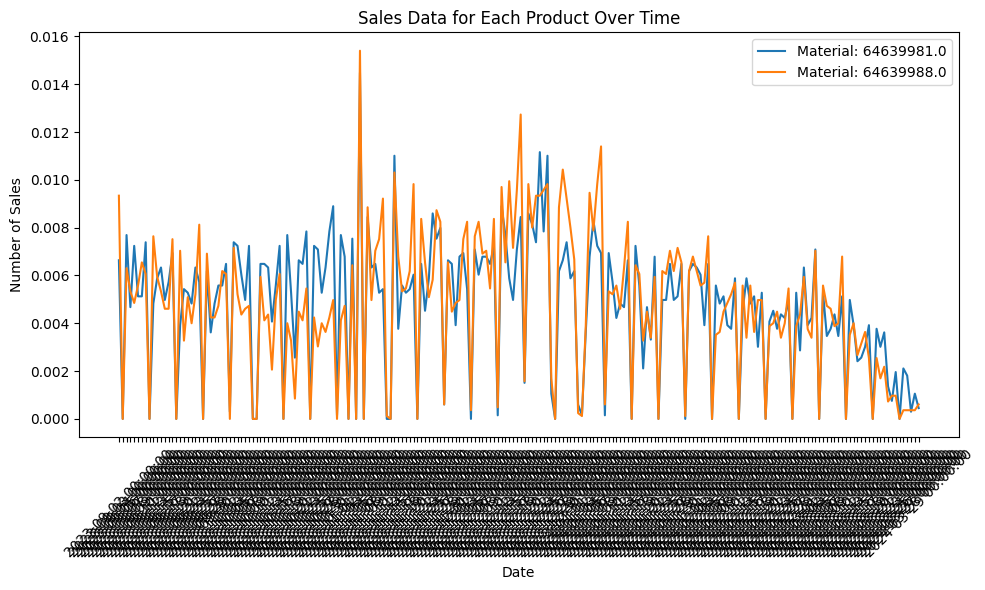

In [18]:
for clusters in range(0,elbow_index):

  cluster1 = z_smartphones[z_smartphones['Cluster'] == clusters]
  cluster1
  date_columns = cluster1.columns[2:-1]
  date_rows = cluster1[cluster1['Material'].notnull()]

  # Plot the values for date rows
  plt.figure(figsize=(10, 6))
  for index, row in date_rows.iterrows():
      plt.plot(date_columns, row[date_columns], label=f"Material: {row['Material']}")
  plt.title('Sales Data for Each Product Over Time')
  plt.xlabel('Date')
  plt.ylabel('Number of Sales')
  plt.xticks(rotation=45)
  plt.legend()
  plt.tight_layout()
  plt.show()

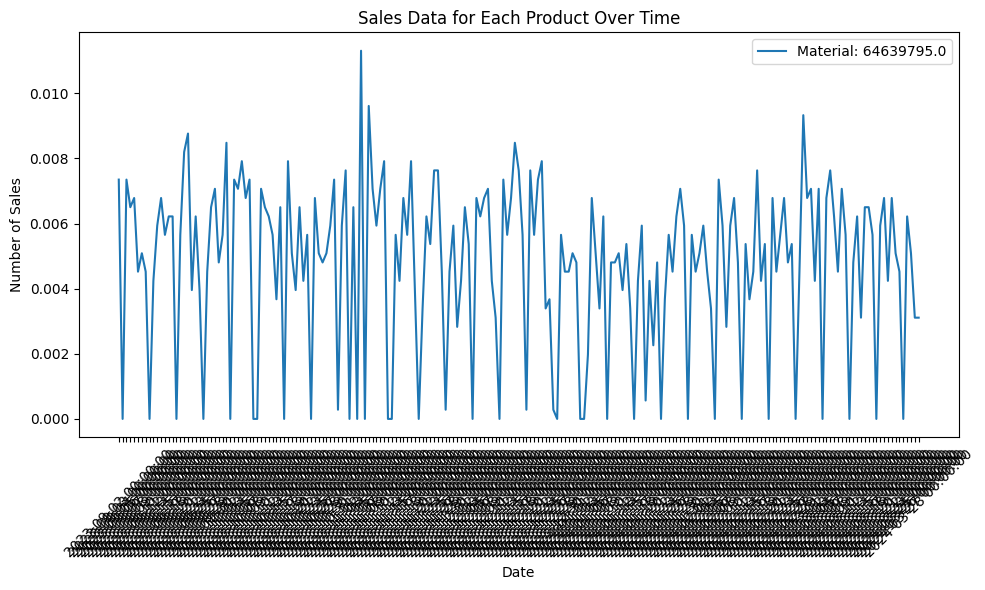

In [19]:
  cluster1 = z_blockphone
  date_columns = cluster1.columns[2:-1]
  date_rows = cluster1[cluster1['Material'].notnull()]

  # Plot the values for date rows
  plt.figure(figsize=(10, 6))
  for index, row in date_rows.iterrows():
      plt.plot(date_columns, row[date_columns], label=f"Material: {row['Material']}")
  plt.title('Sales Data for Each Product Over Time')
  plt.xlabel('Date')
  plt.ylabel('Number of Sales')
  plt.xticks(rotation=45)
  plt.legend()
  plt.tight_layout()
  plt.show()

In [20]:
sales_df2 = z_blockphone.T
sales_df2.columns = sales_df2.iloc[0]

# Drop the first row
sales_df2 = sales_df2[1:]
sales_df2.columns = sales_df2.columns.astype(str)
sales_df2 = sales_df2.reset_index()
sales_df2

Material,Date,64639795.0
0,2023-09-01 00:00:00,0.005370
1,2023-09-02 00:00:00,0.007349
2,2023-09-03 00:00:00,0.000000
3,2023-09-04 00:00:00,0.007349
4,2023-09-05 00:00:00,0.006501
...,...,...
206,2024-03-25 00:00:00,0.006218
207,2024-03-26 00:00:00,0.005088
208,2024-03-27 00:00:00,0.003109
209,2024-03-28 00:00:00,0.003109


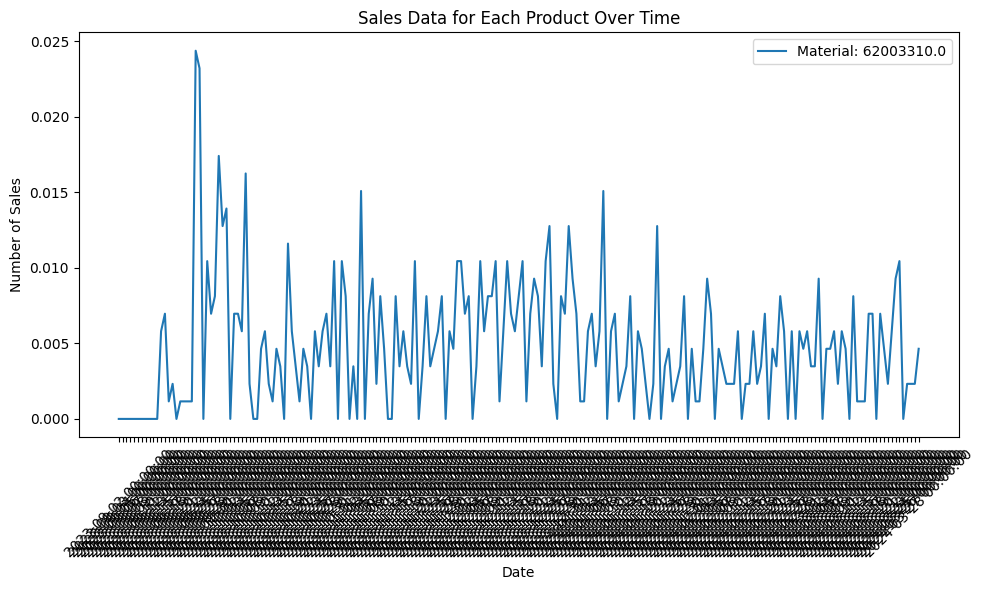

In [21]:
  cluster1 = z_covers
  date_columns = cluster1.columns[2:-1]
  date_rows = cluster1[cluster1['Material'].notnull()]

  # Plot the values for date rows
  plt.figure(figsize=(10, 6))
  for index, row in date_rows.iterrows():
      plt.plot(date_columns, row[date_columns], label=f"Material: {row['Material']}")
  plt.title('Sales Data for Each Product Over Time')
  plt.xlabel('Date')
  plt.ylabel('Number of Sales')
  plt.xticks(rotation=45)
  plt.legend()
  plt.tight_layout()
  plt.show()

In [22]:
sales_df3 = z_covers.T
sales_df3.columns = sales_df3.iloc[0]

# Drop the first row
sales_df3 = sales_df3[1:]
sales_df3.columns = sales_df3.columns.astype(str)
sales_df3 = sales_df3.reset_index()
sales_df3

Material,Date,62003310.0
0,2023-09-01 00:00:00,0.00000
1,2023-09-02 00:00:00,0.00000
2,2023-09-03 00:00:00,0.00000
3,2023-09-04 00:00:00,0.00000
4,2023-09-05 00:00:00,0.00000
...,...,...
206,2024-03-25 00:00:00,0.00232
207,2024-03-26 00:00:00,0.00232
208,2024-03-27 00:00:00,0.00232
209,2024-03-28 00:00:00,0.00464


### Diffusion model

In [23]:
concatenated_df = pd.concat([sales_df.set_index('Date'),
                             sales_df2.set_index('Date'),
                             sales_df3.set_index('Date')], axis=1)

concatenated_df = concatenated_df.reset_index()
concatenated_df

Material,Date,64639984.0,64640000.0,64640153.0,64640219.0,64641022.0,Cluster 5_64639981_6463998,64639795.0,62003310.0
0,2023-09-01 00:00:00,0.007704,0.001213,0.012881,0.000000,0.000000,0.006605,0.005370,0.00000
1,2023-09-02 00:00:00,0.010786,0.005257,0.012567,0.000000,0.000000,0.007988,0.007349,0.00000
2,2023-09-03 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
3,2023-09-04 00:00:00,0.006604,0.007279,0.013509,0.000000,0.000000,0.007000,0.007349,0.00000
4,2023-09-05 00:00:00,0.007704,0.003235,0.008797,0.000000,0.000000,0.005006,0.006501,0.00000
...,...,...,...,...,...,...,...,...,...
206,2024-03-25 00:00:00,0.000660,0.001617,0.002199,0.006239,0.002604,0.001238,0.006218,0.00232
207,2024-03-26 00:00:00,0.001101,0.002022,0.001885,0.003772,0.007812,0.001087,0.005088,0.00232
208,2024-03-27 00:00:00,0.000440,0.004044,0.002828,0.006021,0.006510,0.000333,0.003109,0.00232
209,2024-03-28 00:00:00,0.000660,0.002426,0.003456,0.007254,0.003906,0.000710,0.003109,0.00464


In [24]:
cumulative_df = concatenated_df.cumsum()

# Rename the columns to indicate that they contain cumulative values
cumulative_df.columns = [f'Cumulative_{col}' for col in concatenated_df.columns]

# Concatenate the original DataFrame with the cumulative DataFrame horizontally
result_df = pd.concat([concatenated_df, cumulative_df], axis=1)

result_df = result_df.drop(columns = ['Cumulative_Date'])
result_df

,Date,64639984.0,64640000.0,64640153.0,64640219.0,64641022.0,Cluster 5_64639981_6463998,64639795.0,62003310.0,Cumulative_64639984.0,Cumulative_64640000.0,Cumulative_64640153.0,Cumulative_64640219.0,Cumulative_64641022.0,Cumulative_Cluster 5_64639981_6463998,Cumulative_64639795.0,Cumulative_62003310.0
0,2023-09-01 00:00:00,0.007704,0.001213,0.012881,0.000000,0.000000,0.006605,0.005370,0.00000,0.007704,0.001213,0.012881,0.000000,0.000000,0.006605,0.005370,0.000000
1,2023-09-02 00:00:00,0.010786,0.005257,0.012567,0.000000,0.000000,0.007988,0.007349,0.00000,0.018490,0.006470,0.025448,0.000000,0.000000,0.014592,0.012719,0.000000
2,2023-09-03 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.018490,0.006470,0.025448,0.000000,0.000000,0.014592,0.012719,0.000000
3,2023-09-04 00:00:00,0.006604,0.007279,0.013509,0.000000,0.000000,0.007000,0.007349,0.00000,0.025094,0.013748,0.038957,0.000000,0.000000,0.021592,0.020068,0.000000
4,2023-09-05 00:00:00,0.007704,0.003235,0.008797,0.000000,0.000000,0.005006,0.006501,0.00000,0.032798,0.016983,0.047754,0.000000,0.000000,0.026598,0.026569,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,2024-03-25 00:00:00,0.000660,0.001617,0.002199,0.006239,0.002604,0.001238,0.006218,0.00232,0.997138,0.988273,0.989318,0.975190,0.981771,0.997341,0.983889,0.986079
207,2024-03-26 00:00:00,0.001101,0.002022,0.001885,0.003772,0.007812,0.001087,0.005088,0.00232,0.998239,0.990295,0.991203,0.978963,0.989583,0.998428,0.988977,0.988399
208,2024-03-27 00:00:00,0.000440,0.004044,0.002828,0.006021,0.006510,0.000333,0.003109,0.00232,0.998679,0.994339,0.994031,0.984984,0.996094,0.998761,0.992086,0.990719
209,2024-03-28 00:00:00,0.000660,0.002426,0.003456,0.007254,0.003906,0.000710,0.003109,0.00464,0.999340,0.996765,0.997487,0.992238,1.000000,0.999471,0.995195,0.995360


## Generate Forecast

### For all products

We use ARMA model for each cluster that previously has been optimized and fit for each cluster (lowest AIC). See Appendix

In [25]:
# Create table of ARMA parameters
cluster = [1,2,3,4,5,6,6,7,8]
materials = [64639984, 64640000, 64640153, 64640219, 64641022, 64639981,
             64639988, 64639795, 62003310]
AR = [7,8,8,7,7,7,7,7,7]
MA = [7,7,8,9,0,9,9,7,7]
types = ['smartphones', 'smartphones', 'smartphones', 'smartphones',
         'smartphones', 'smartphones', 'smartphones', 'blockphones',
         'covers']

df_parameter = pd.DataFrame({'Material': materials, 'Cluster': cluster,
                             'Type': types, 'AR': AR, 'MA': MA})

df_parameter

,Material,Cluster,Type,AR,MA
0,64639984,1,smartphones,7,7
1,64640000,2,smartphones,8,7
2,64640153,3,smartphones,8,8
3,64640219,4,smartphones,7,9
4,64641022,5,smartphones,7,0
5,64639981,6,smartphones,7,9
6,64639988,6,smartphones,7,9
7,64639795,7,blockphones,7,7
8,62003310,8,covers,7,7


In [26]:
df_reset = df.reset_index(level=2)
df_sum_shop = df_reset.pivot_table(index='Plant', columns='Material', values='Demand', aggfunc='sum').T

df_sum_shop

Plant,B124,B238,B319,B420,B534,B536,T101,T102,T103,T105,...,T754,T760,T772,T780,T782,T790,T791,T792,T794,T942
Material,,,,,,,,,,,,,,,,,,,,,
62003310,3.0,12.0,19.0,21.0,10.0,6.0,12.0,6.0,7.0,8.0,...,8.0,18.0,13.0,10.0,15.0,7.0,5.0,14.0,5.0,3.0
64639795,27.0,24.0,9.0,67.0,41.0,28.0,57.0,58.0,64.0,25.0,...,68.0,78.0,11.0,14.0,6.0,10.0,9.0,3.0,2.0,36.0
64639981,46.0,76.0,41.0,117.0,70.0,61.0,86.0,93.0,72.0,46.0,...,56.0,168.0,71.0,38.0,73.0,21.0,44.0,80.0,41.0,87.0
64639984,27.0,68.0,22.0,55.0,68.0,42.0,56.0,87.0,80.0,47.0,...,49.0,86.0,38.0,28.0,34.0,44.0,28.0,36.0,11.0,50.0
64639988,75.0,170.0,56.0,229.0,84.0,83.0,97.0,121.0,137.0,90.0,...,89.0,209.0,64.0,68.0,114.0,77.0,54.0,99.0,50.0,54.0
64640000,34.0,33.0,29.0,73.0,35.0,29.0,34.0,24.0,26.0,17.0,...,14.0,57.0,21.0,18.0,30.0,3.0,34.0,50.0,19.0,11.0
64640153,24.0,28.0,54.0,83.0,36.0,17.0,29.0,37.0,26.0,28.0,...,30.0,37.0,36.0,33.0,62.0,49.0,34.0,102.0,31.0,22.0
64640219,100.0,198.0,233.0,408.0,112.0,206.0,121.0,114.0,184.0,132.0,...,95.0,282.0,122.0,175.0,377.0,115.0,141.0,377.0,192.0,61.0
64641022,4.0,8.0,18.0,23.0,15.0,14.0,3.0,3.0,7.0,4.0,...,4.0,17.0,5.0,7.0,18.0,3.0,13.0,16.0,7.0,6.0


In [ ]:
df_sum_shop.loc[64640219]['B124']

In [ ]:
df_contribution.loc['B319'][64640153]

0.016965127238454288

In [ ]:
plt.style.use('seaborn')

Material: 64640153
Shop: B124
AR 8 MA 8
Sum demand for this material: 3183.0


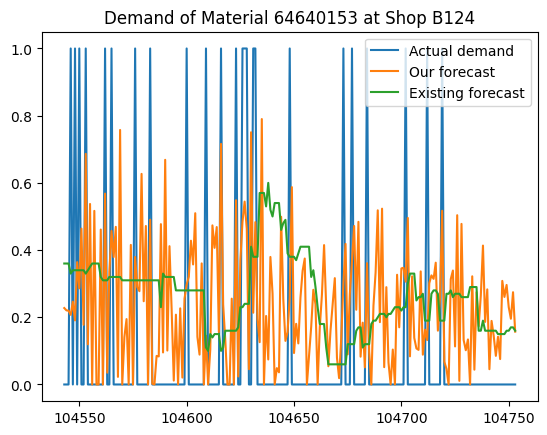

Material: 64640153
Shop: B238
AR 8 MA 8
Sum demand for this material: 3183.0


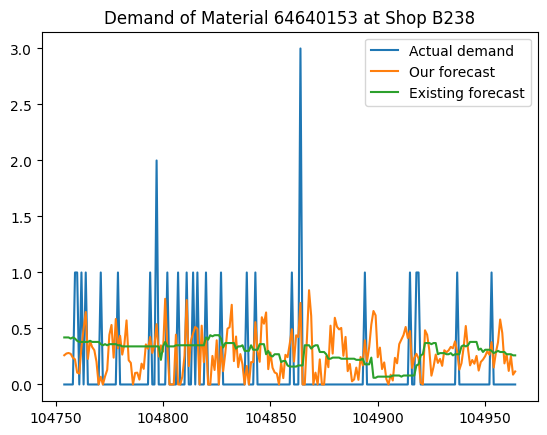

Material: 64640153
Shop: B319
AR 8 MA 8
Sum demand for this material: 3183.0


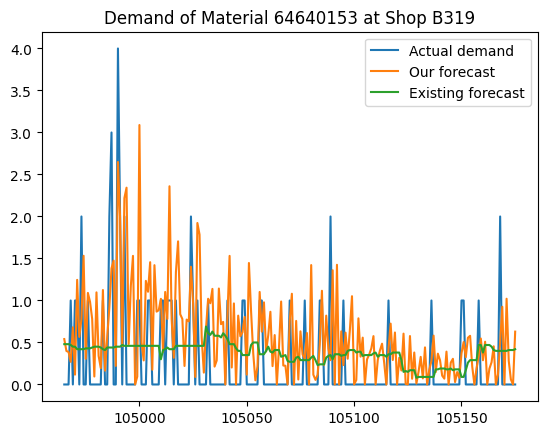

Material: 64640153
Shop: B420
AR 8 MA 8
Sum demand for this material: 3183.0


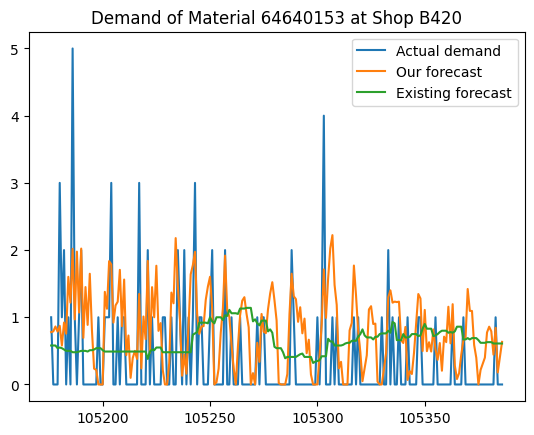

Material: 64640153
Shop: B534
AR 8 MA 8
Sum demand for this material: 3183.0


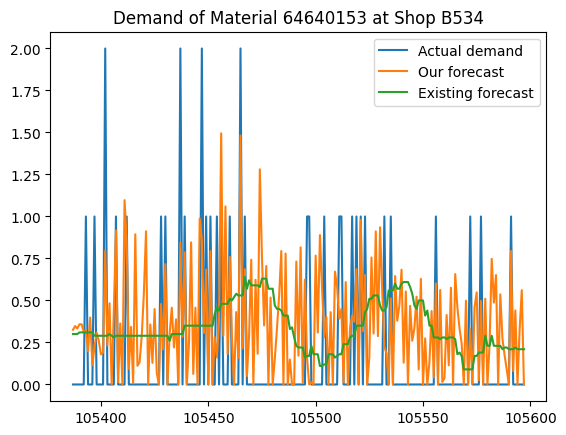

Material: 64640153
Shop: B536
AR 8 MA 8
Sum demand for this material: 3183.0


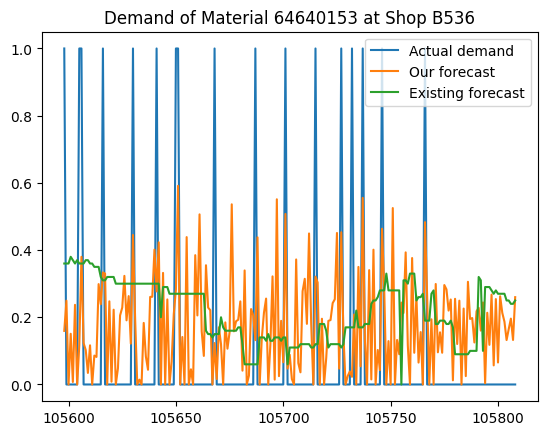

Material: 64640153
Shop: T101
AR 8 MA 8
Sum demand for this material: 3183.0


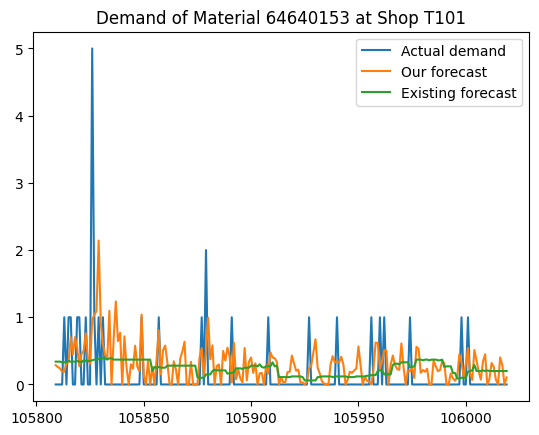

Material: 64640153
Shop: T102
AR 8 MA 8
Sum demand for this material: 3183.0


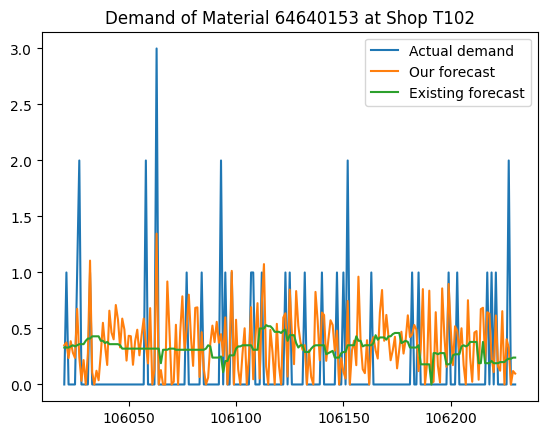

Material: 64640153
Shop: T103
AR 8 MA 8
Sum demand for this material: 3183.0


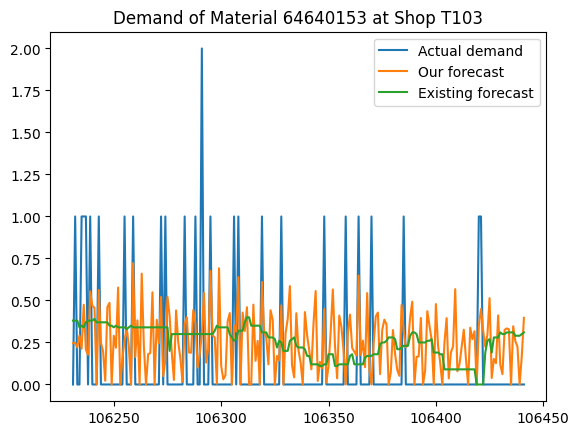

Material: 64640153
Shop: T105
AR 8 MA 8
Sum demand for this material: 3183.0


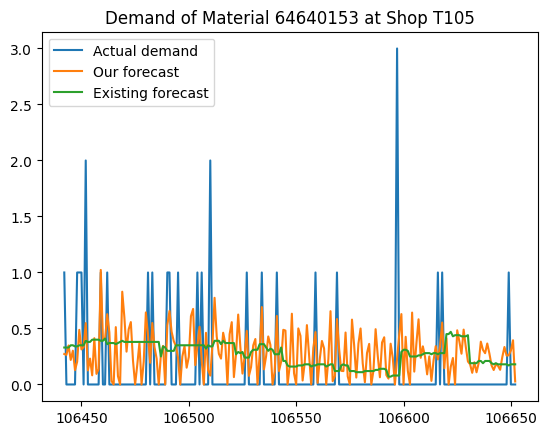

Material: 64640153
Shop: T107
AR 8 MA 8
Sum demand for this material: 3183.0


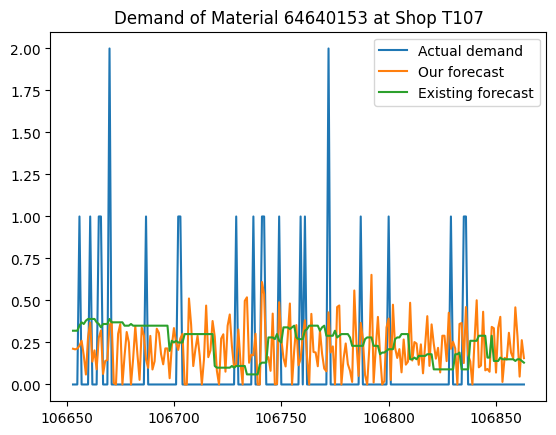

Material: 64640153
Shop: T110
AR 8 MA 8
Sum demand for this material: 3183.0


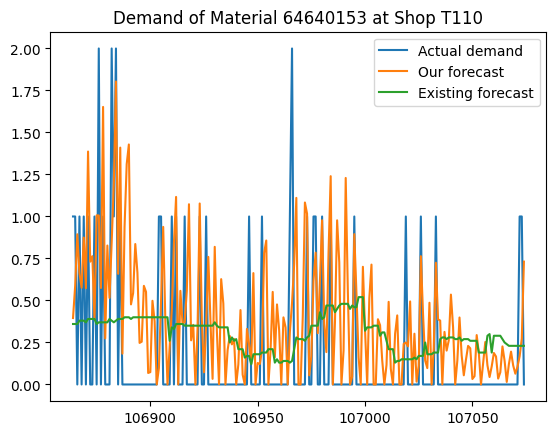

Material: 64640153
Shop: T111
AR 8 MA 8
Sum demand for this material: 3183.0


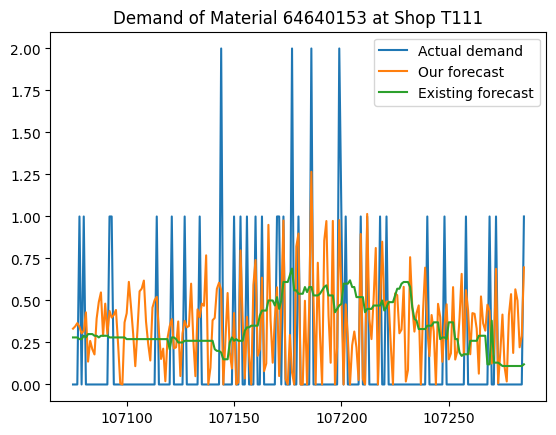

Material: 64640153
Shop: T113
AR 8 MA 8
Sum demand for this material: 3183.0


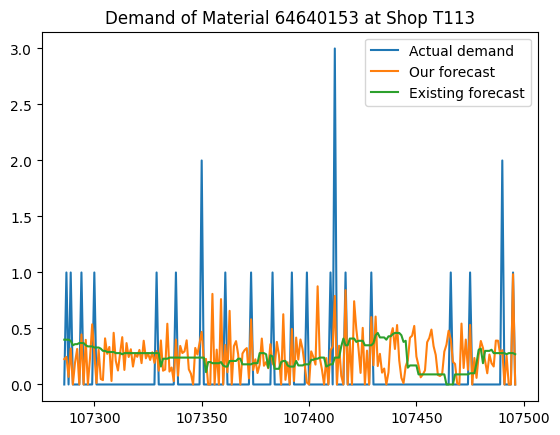

Material: 64640153
Shop: T114
AR 8 MA 8
Sum demand for this material: 3183.0


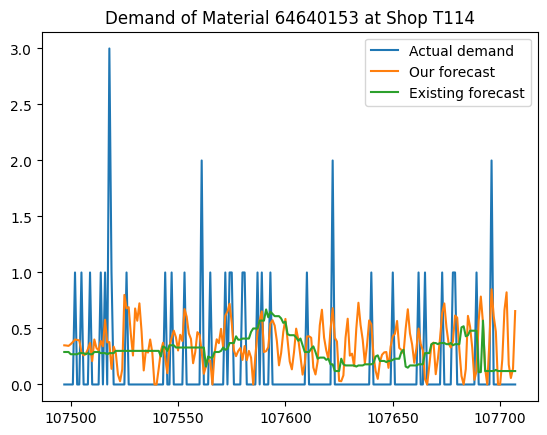

Material: 64640153
Shop: T115
AR 8 MA 8
Sum demand for this material: 3183.0


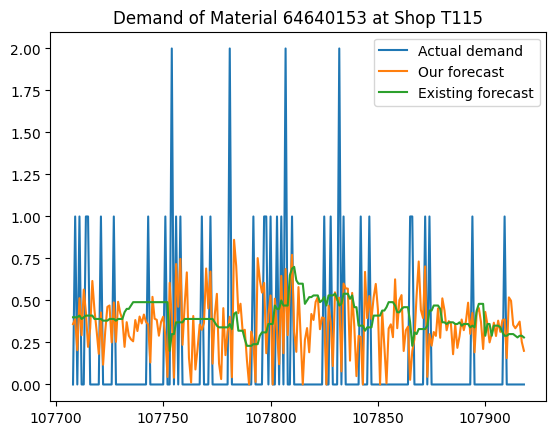

Material: 64640153
Shop: T120
AR 8 MA 8
Sum demand for this material: 3183.0


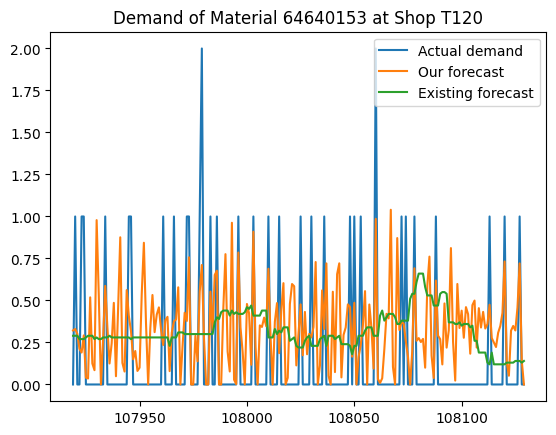

Material: 64640153
Shop: T125
AR 8 MA 8
Sum demand for this material: 3183.0


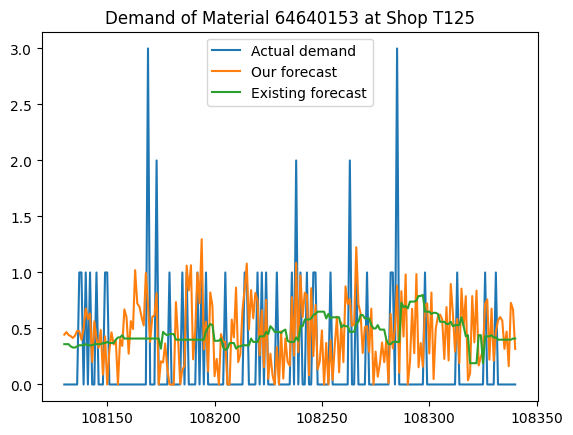

Material: 64640153
Shop: T126
AR 8 MA 8
Sum demand for this material: 3183.0


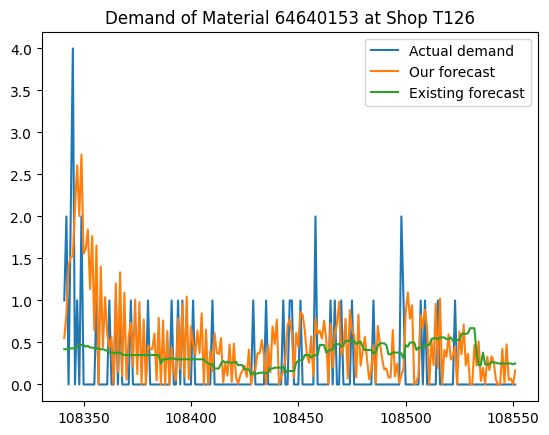

Material: 64640153
Shop: T127
AR 8 MA 8
Sum demand for this material: 3183.0


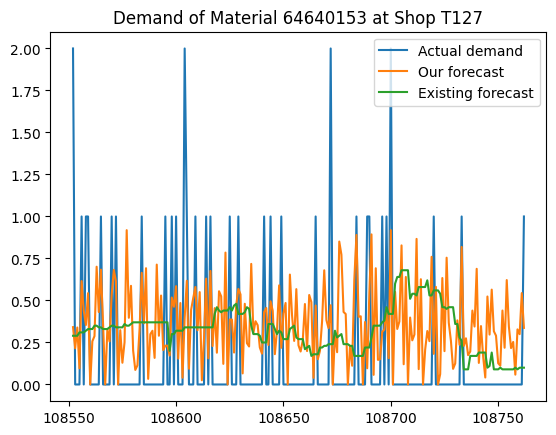

Material: 64640153
Shop: T128
AR 8 MA 8
Sum demand for this material: 3183.0


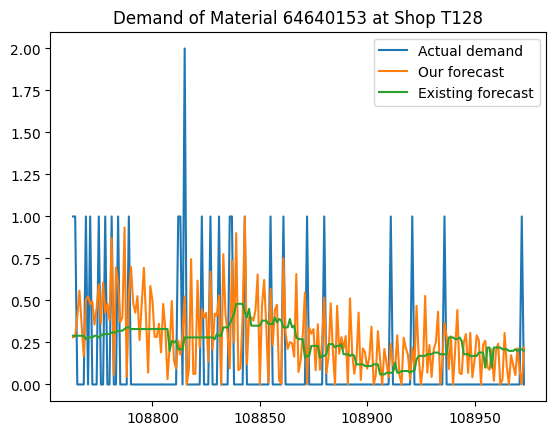

Material: 64640153
Shop: T129
AR 8 MA 8
Sum demand for this material: 3183.0


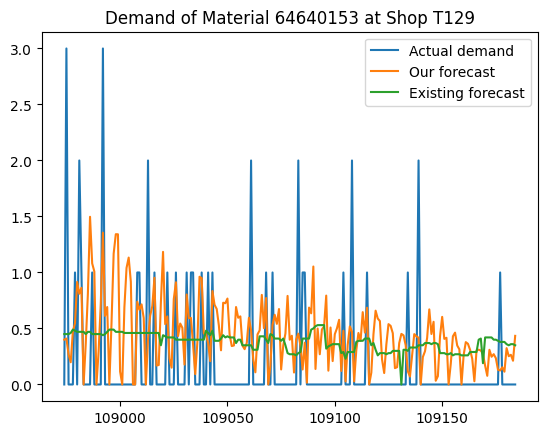

Material: 64640153
Shop: T146
AR 8 MA 8
Sum demand for this material: 3183.0


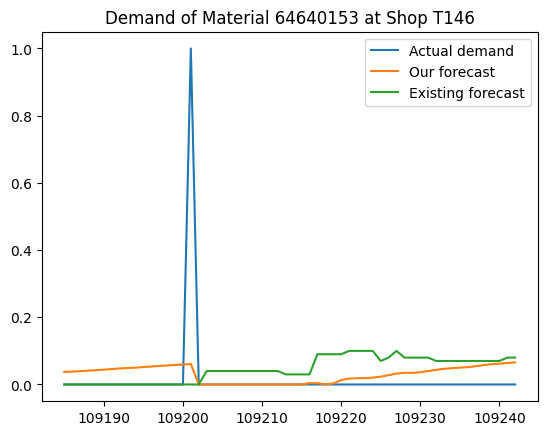

Material: 64640153
Shop: T149
AR 8 MA 8
Sum demand for this material: 3183.0


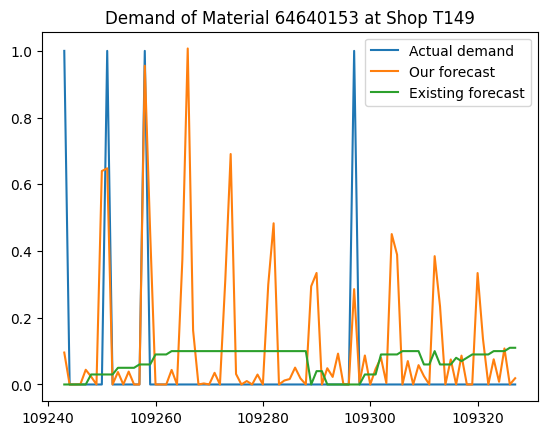

Material: 64640153
Shop: T201
AR 8 MA 8
Sum demand for this material: 3183.0


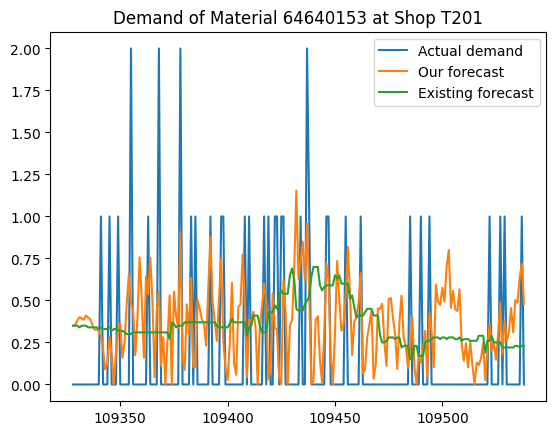

Material: 64640153
Shop: T202
AR 8 MA 8
Sum demand for this material: 3183.0


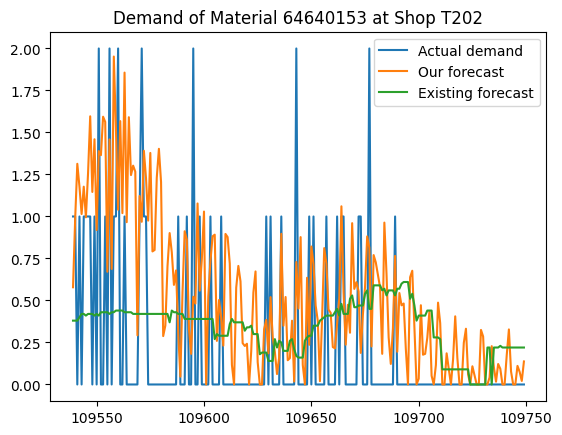

Material: 64640153
Shop: T204
AR 8 MA 8
Sum demand for this material: 3183.0


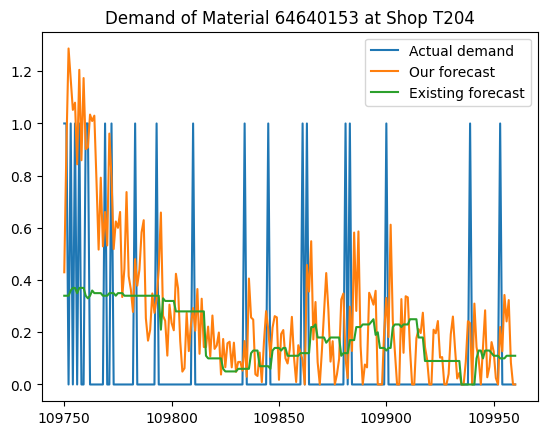

Material: 64640153
Shop: T205
AR 8 MA 8
Sum demand for this material: 3183.0


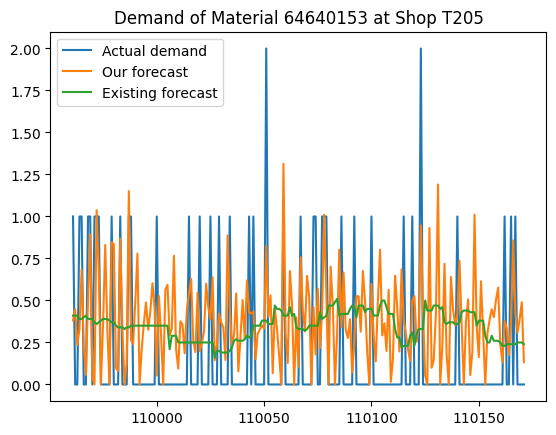

Material: 64640153
Shop: T206
AR 8 MA 8
Sum demand for this material: 3183.0


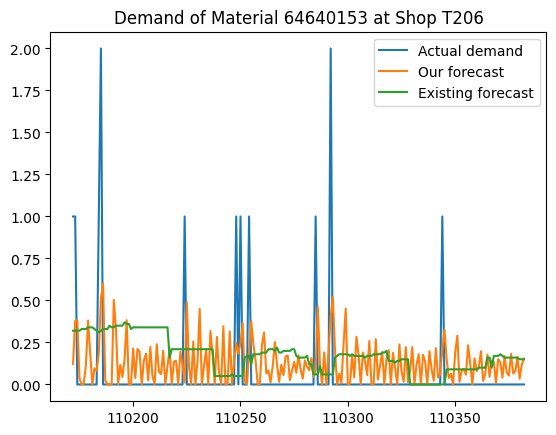

Material: 64640153
Shop: T207
AR 8 MA 8
Sum demand for this material: 3183.0
Error
Material: 64640153
Shop: T209
AR 8 MA 8
Sum demand for this material: 3183.0


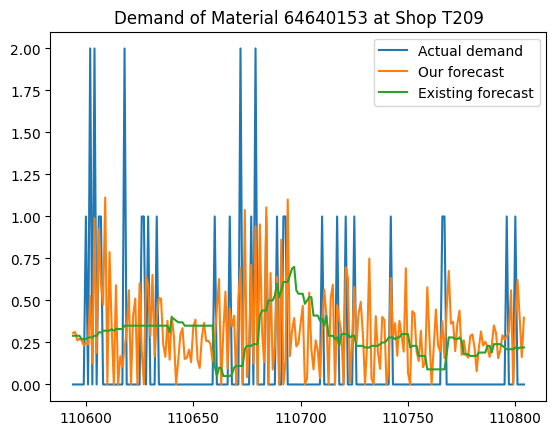

Material: 64640153
Shop: T210
AR 8 MA 8
Sum demand for this material: 3183.0


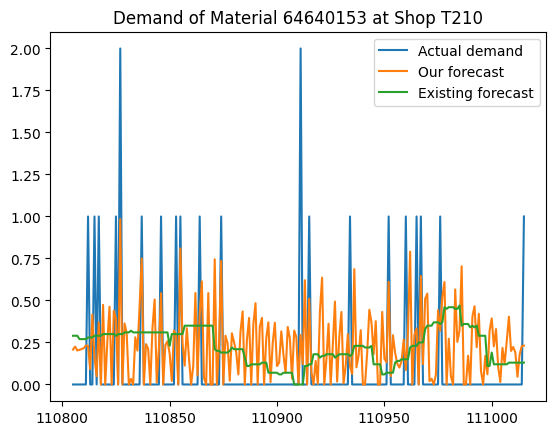

Material: 64640153
Shop: T213
AR 8 MA 8
Sum demand for this material: 3183.0


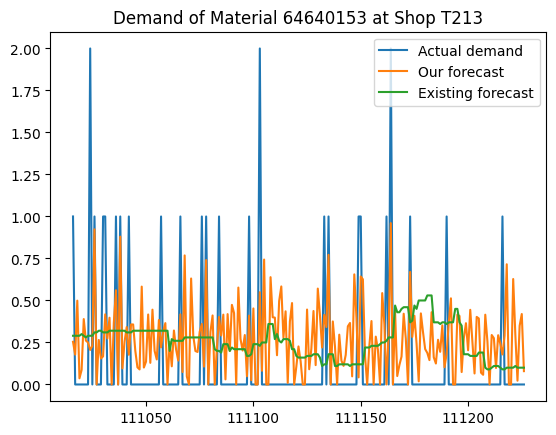

Material: 64640153
Shop: T215
AR 8 MA 8
Sum demand for this material: 3183.0


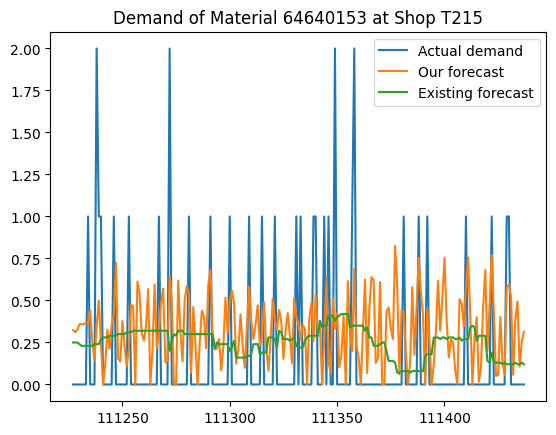

Material: 64640153
Shop: T216
AR 8 MA 8
Sum demand for this material: 3183.0


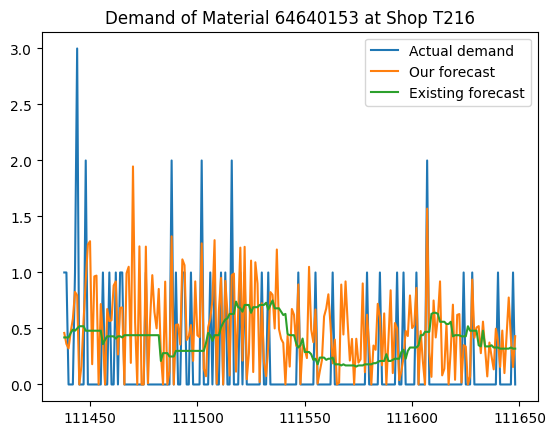

Material: 64640153
Shop: T220
AR 8 MA 8
Sum demand for this material: 3183.0


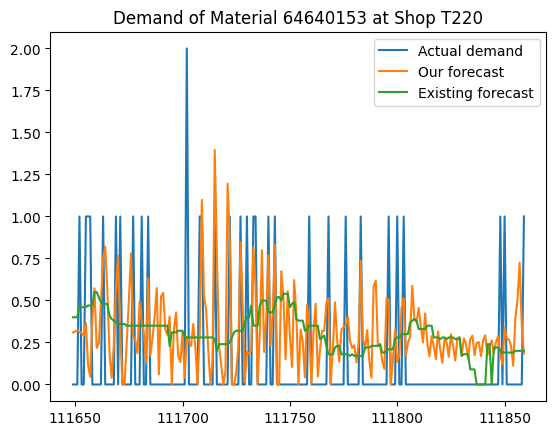

Material: 64640153
Shop: T223
AR 8 MA 8
Sum demand for this material: 3183.0


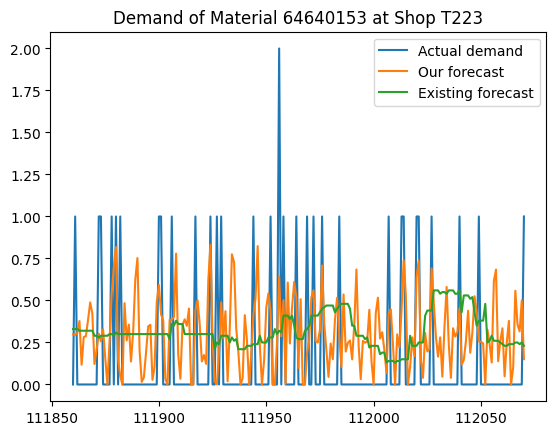

Material: 64640153
Shop: T232
AR 8 MA 8
Sum demand for this material: 3183.0


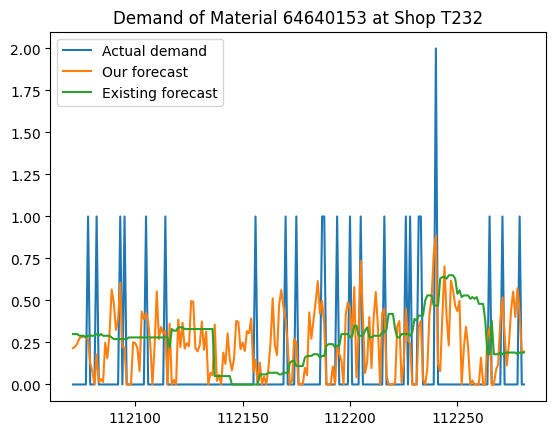

Material: 64640153
Shop: T233
AR 8 MA 8
Sum demand for this material: 3183.0


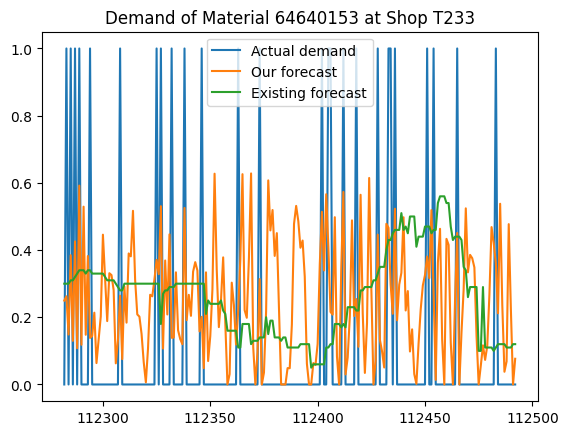

Material: 64640153
Shop: T234
AR 8 MA 8
Sum demand for this material: 3183.0


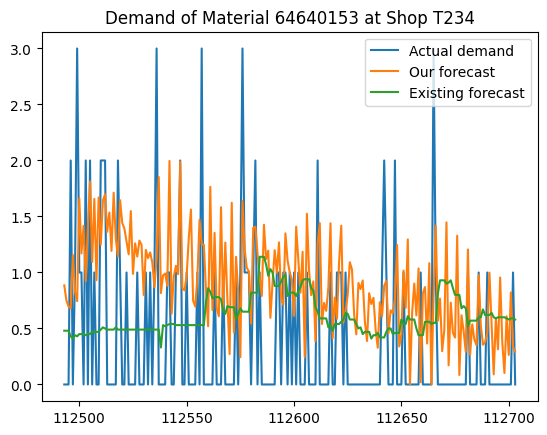

Material: 64640153
Shop: T237
AR 8 MA 8
Sum demand for this material: 3183.0


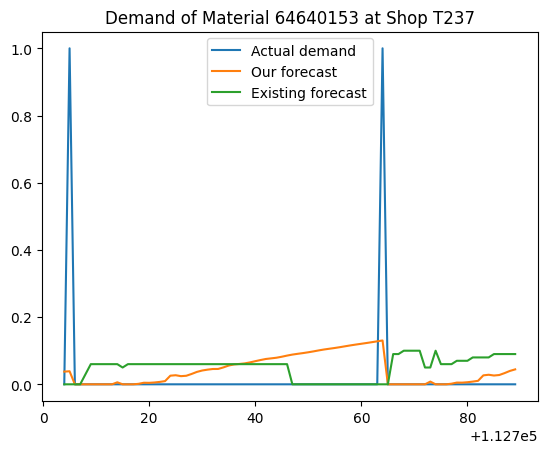

Material: 64640153
Shop: T238
AR 8 MA 8
Sum demand for this material: 3183.0


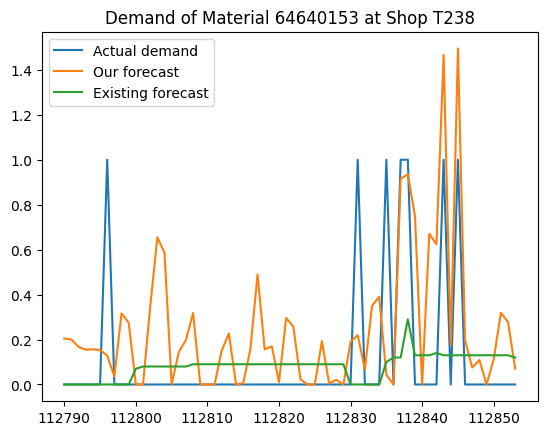

Material: 64640153
Shop: T301
AR 8 MA 8
Sum demand for this material: 3183.0


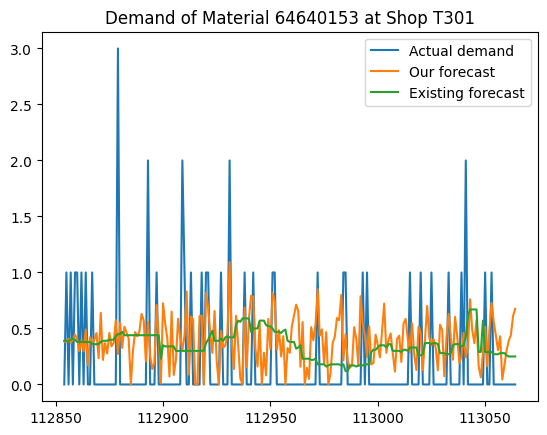

Material: 64640153
Shop: T302
AR 8 MA 8
Sum demand for this material: 3183.0


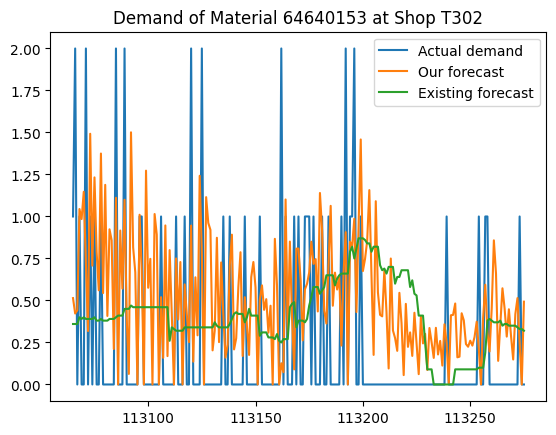

Material: 64640153
Shop: T303
AR 8 MA 8
Sum demand for this material: 3183.0


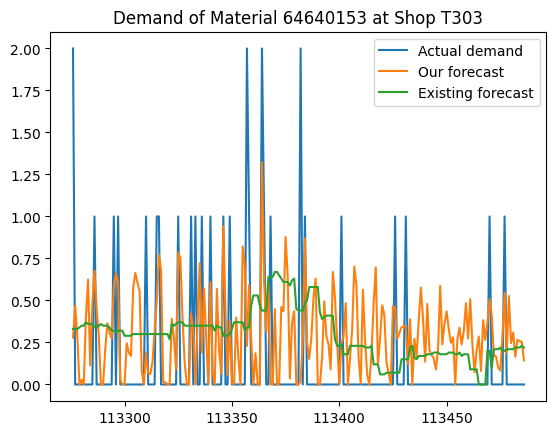

Material: 64640153
Shop: T304
AR 8 MA 8
Sum demand for this material: 3183.0


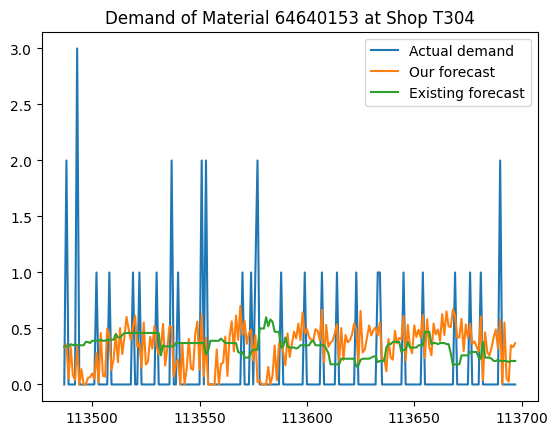

Material: 64640153
Shop: T305
AR 8 MA 8
Sum demand for this material: 3183.0


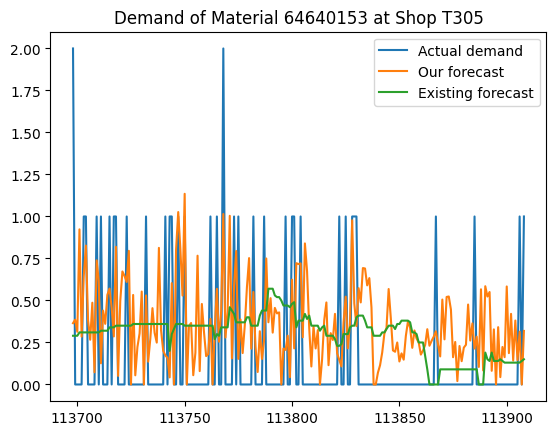

Material: 64640153
Shop: T311
AR 8 MA 8
Sum demand for this material: 3183.0


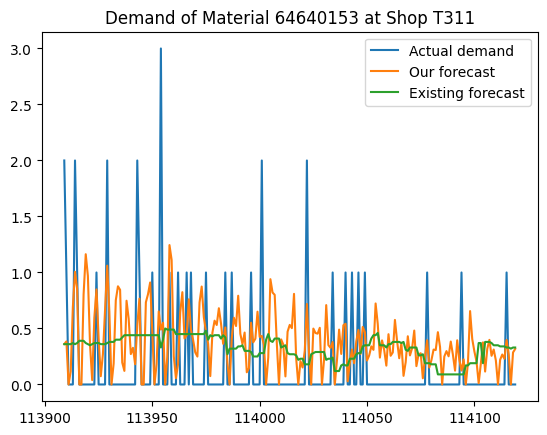

Material: 64640153
Shop: T315
AR 8 MA 8
Sum demand for this material: 3183.0


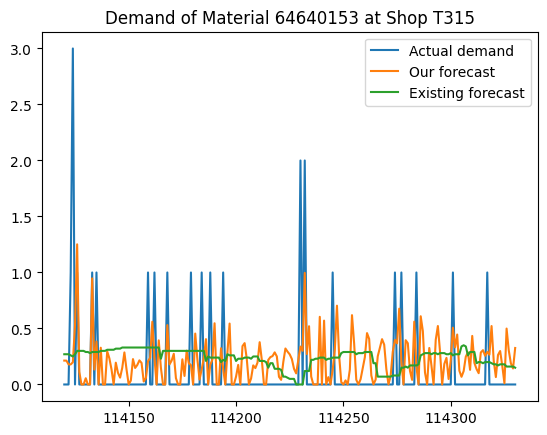

Material: 64640153
Shop: T316
AR 8 MA 8
Sum demand for this material: 3183.0


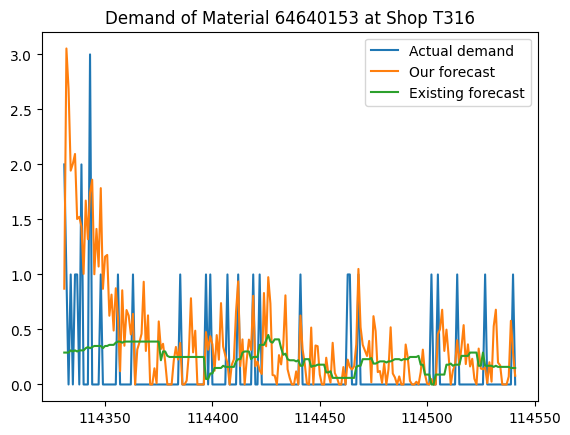

Material: 64640153
Shop: T317
AR 8 MA 8
Sum demand for this material: 3183.0


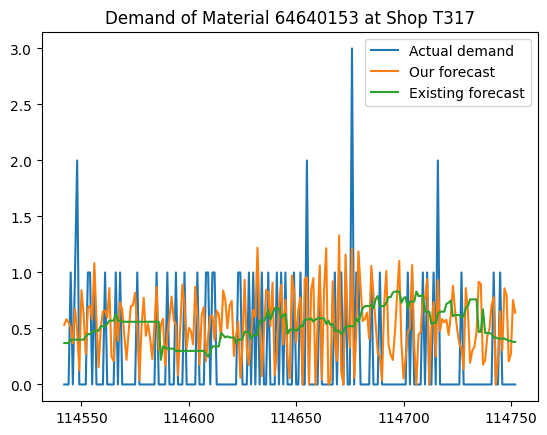

Material: 64640153
Shop: T318
AR 8 MA 8
Sum demand for this material: 3183.0


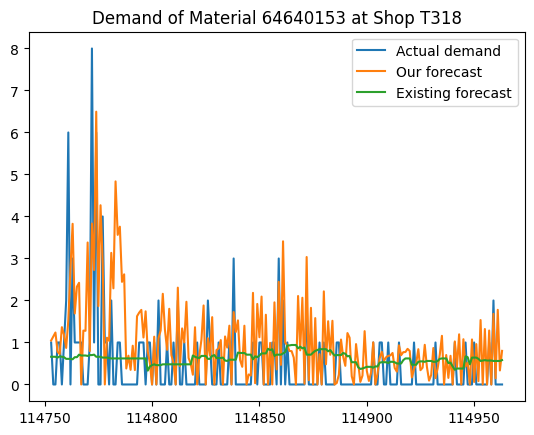

Material: 64640153
Shop: T325
AR 8 MA 8
Sum demand for this material: 3183.0


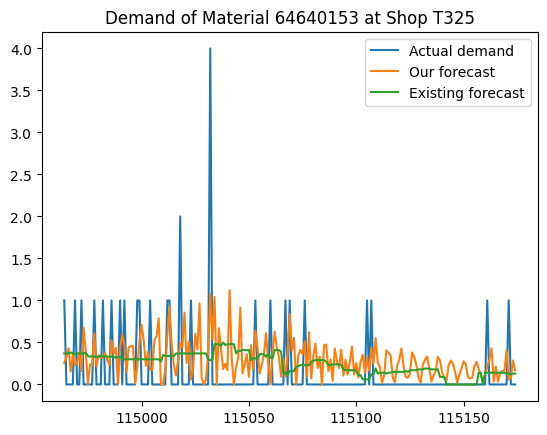

Material: 64640153
Shop: T348
AR 8 MA 8
Sum demand for this material: 3183.0


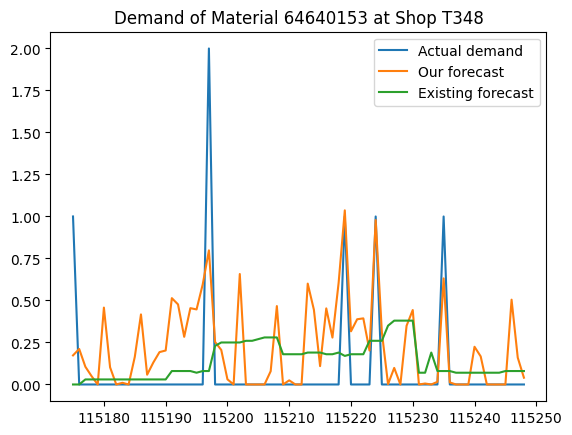

Material: 64640153
Shop: T403
AR 8 MA 8
Sum demand for this material: 3183.0


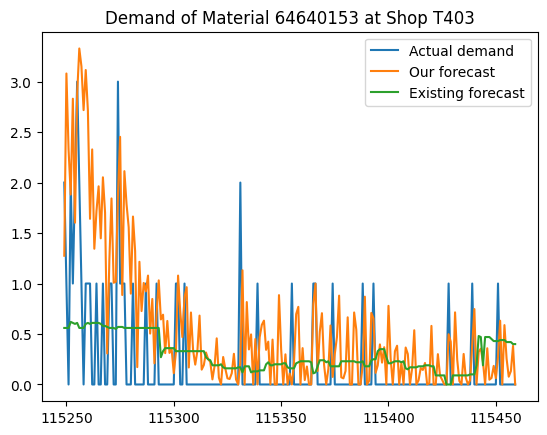

Material: 64640153
Shop: T407
AR 8 MA 8
Sum demand for this material: 3183.0


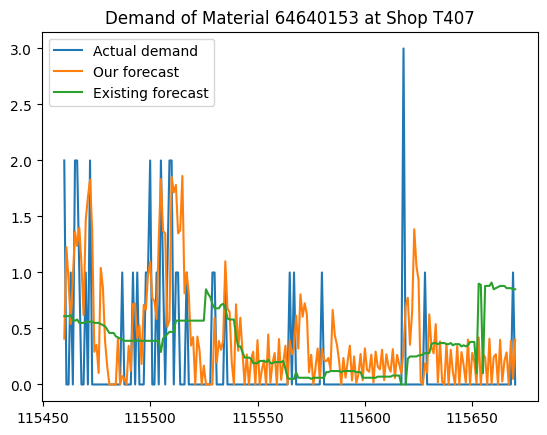

Material: 64640153
Shop: T410
AR 8 MA 8
Sum demand for this material: 3183.0


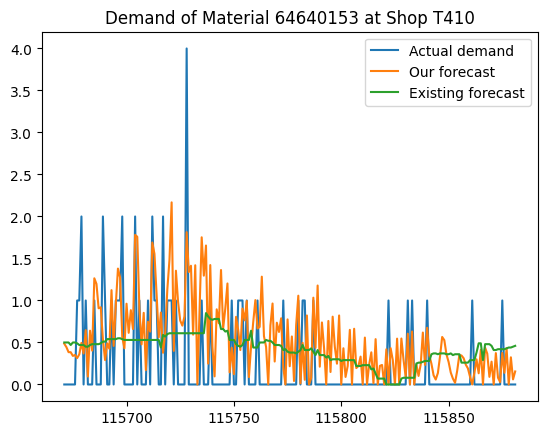

Material: 64640153
Shop: T411
AR 8 MA 8
Sum demand for this material: 3183.0


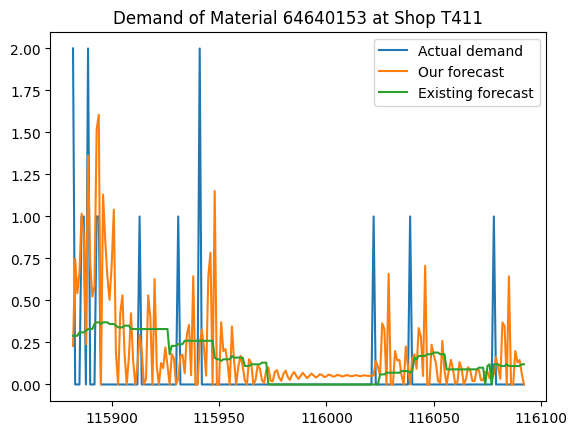

Material: 64640153
Shop: T412
AR 8 MA 8
Sum demand for this material: 3183.0


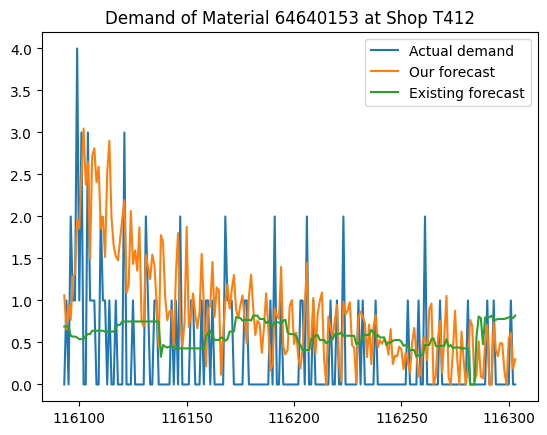

Material: 64640153
Shop: T413
AR 8 MA 8
Sum demand for this material: 3183.0


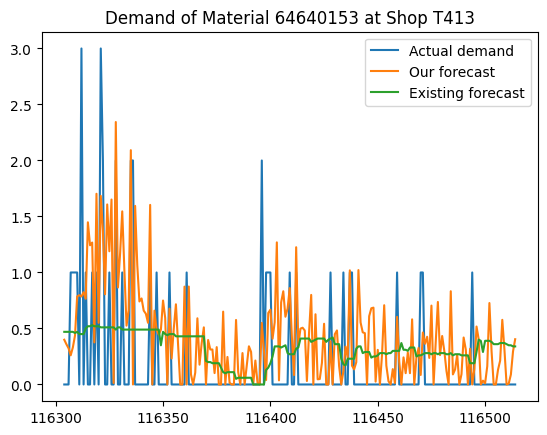

Material: 64640153
Shop: T415
AR 8 MA 8
Sum demand for this material: 3183.0


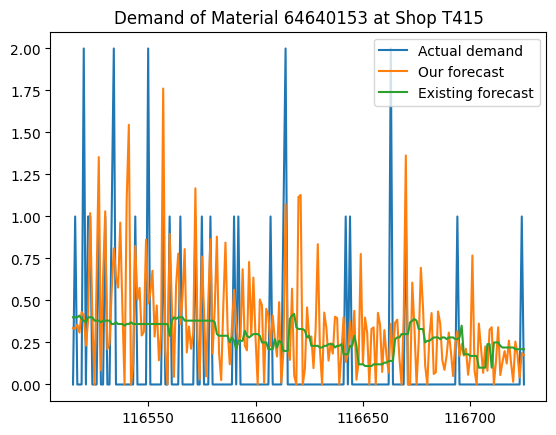

Material: 64640153
Shop: T504
AR 8 MA 8
Sum demand for this material: 3183.0


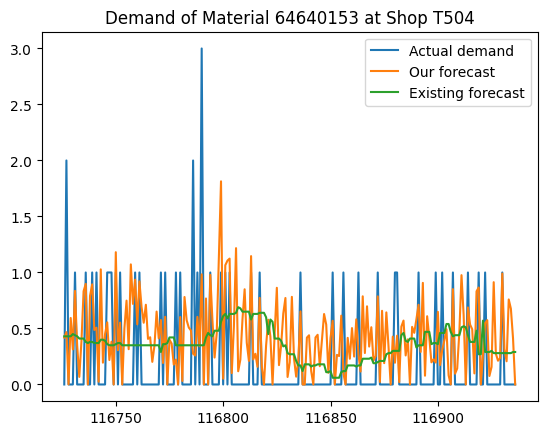

Material: 64640153
Shop: T507
AR 8 MA 8
Sum demand for this material: 3183.0


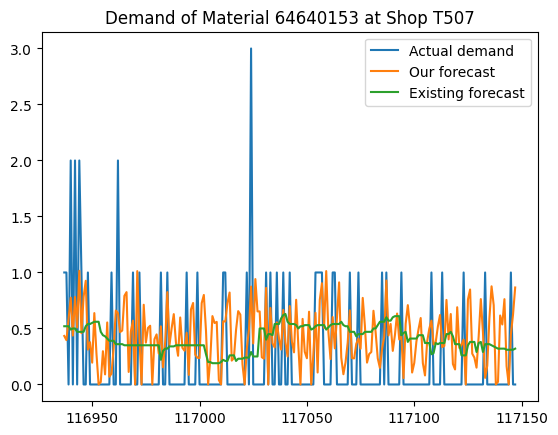

Material: 64640153
Shop: T508
AR 8 MA 8
Sum demand for this material: 3183.0


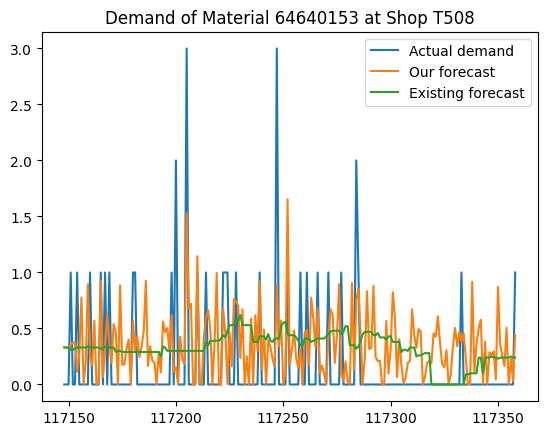

Material: 64640153
Shop: T509
AR 8 MA 8
Sum demand for this material: 3183.0


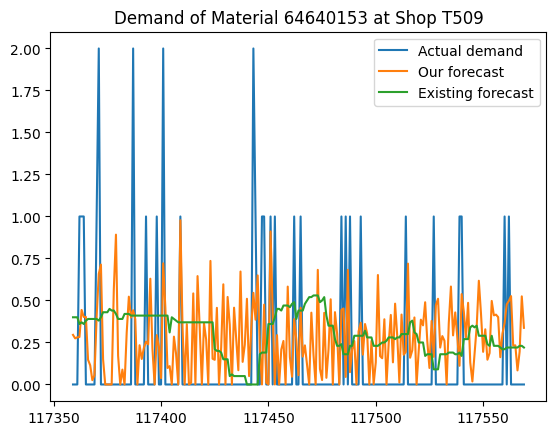

Material: 64640153
Shop: T510
AR 8 MA 8
Sum demand for this material: 3183.0


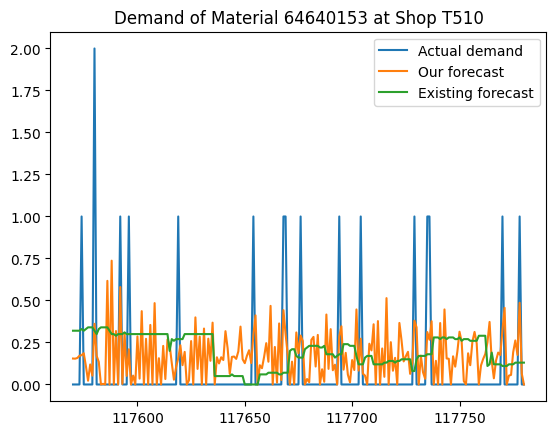

Material: 64640153
Shop: T513
AR 8 MA 8
Sum demand for this material: 3183.0


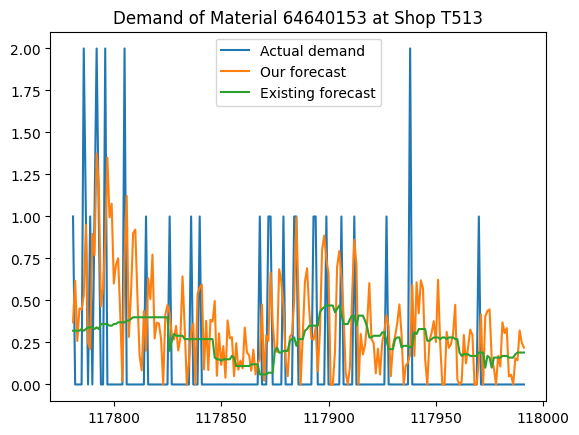

Material: 64640153
Shop: T517
AR 8 MA 8
Sum demand for this material: 3183.0


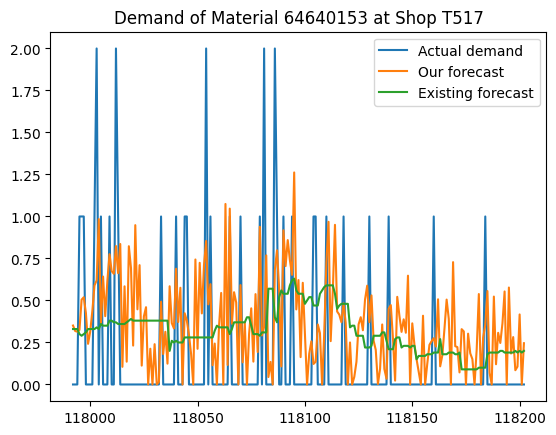

Material: 64640153
Shop: T518
AR 8 MA 8
Sum demand for this material: 3183.0


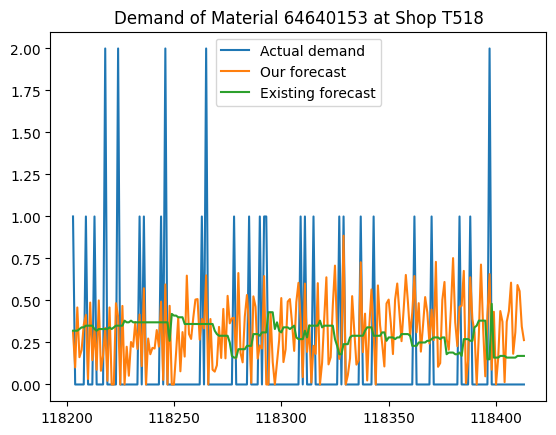

Material: 64640153
Shop: T520
AR 8 MA 8
Sum demand for this material: 3183.0


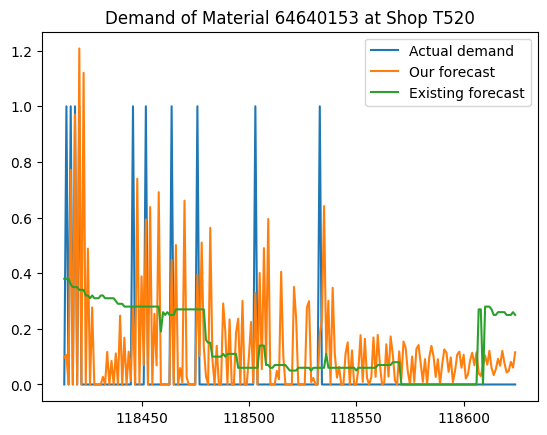

Material: 64640153
Shop: T527
AR 8 MA 8
Sum demand for this material: 3183.0


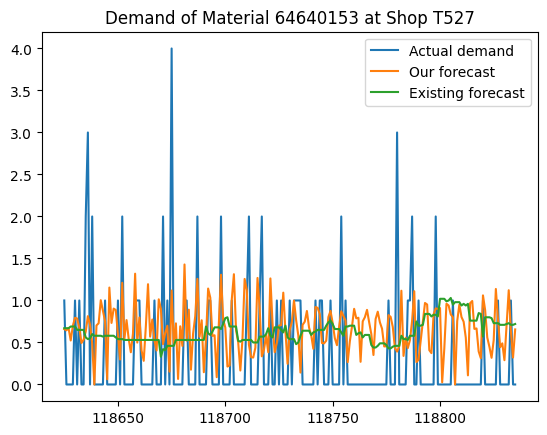

Material: 64640153
Shop: T529
AR 8 MA 8
Sum demand for this material: 3183.0


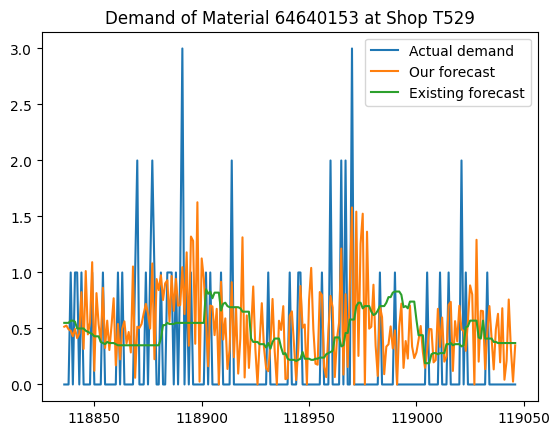

Material: 64640153
Shop: T531
AR 8 MA 8
Sum demand for this material: 3183.0


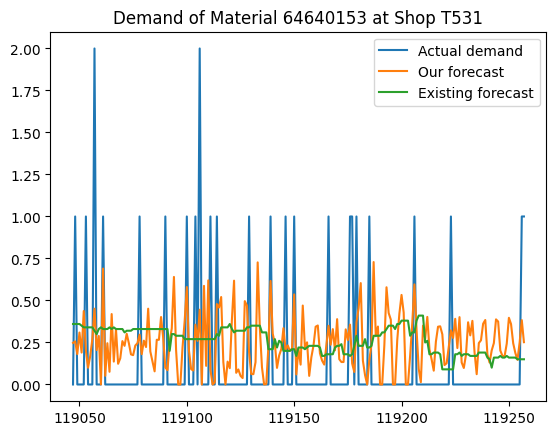

Material: 64640153
Shop: T724
AR 8 MA 8
Sum demand for this material: 3183.0


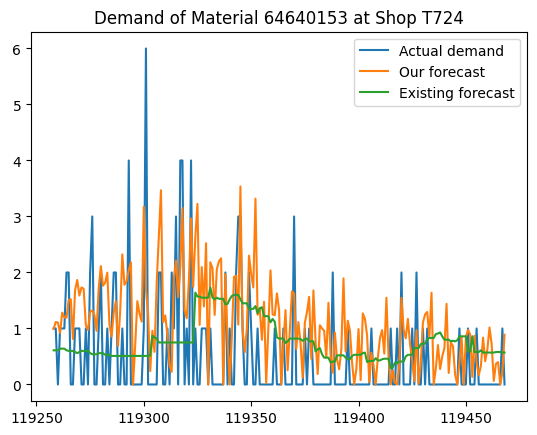

Material: 64640153
Shop: T734
AR 8 MA 8
Sum demand for this material: 3183.0


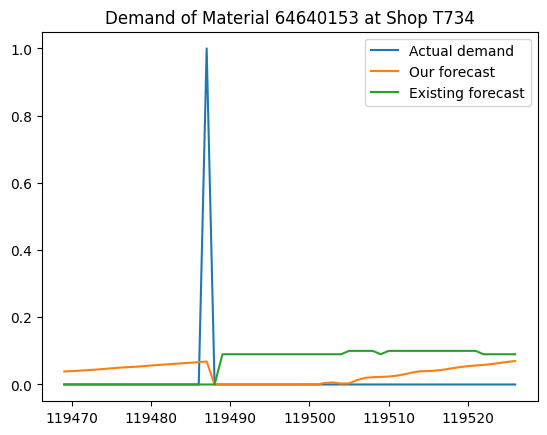

Material: 64640153
Shop: T743
AR 8 MA 8
Sum demand for this material: 3183.0


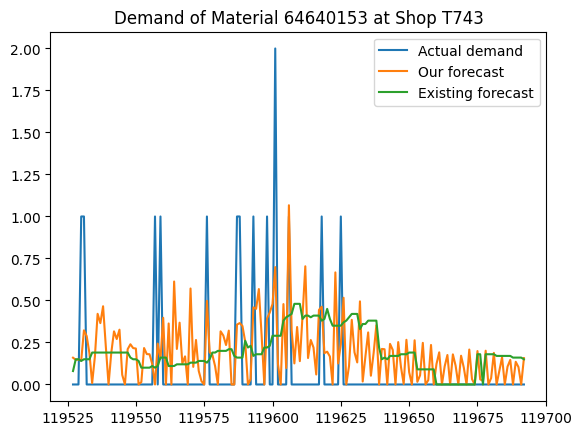

Material: 64640153
Shop: T751
AR 8 MA 8
Sum demand for this material: 3183.0


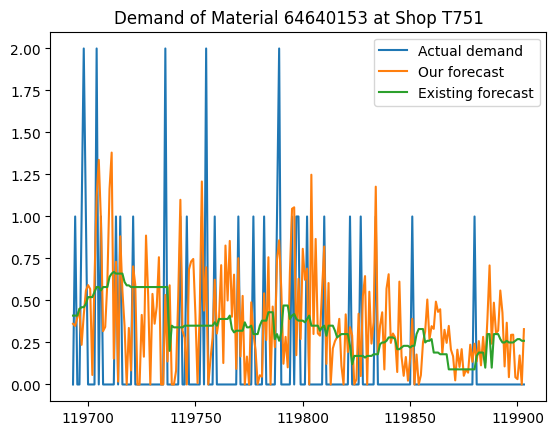

Material: 64640153
Shop: T753
AR 8 MA 8
Sum demand for this material: 3183.0


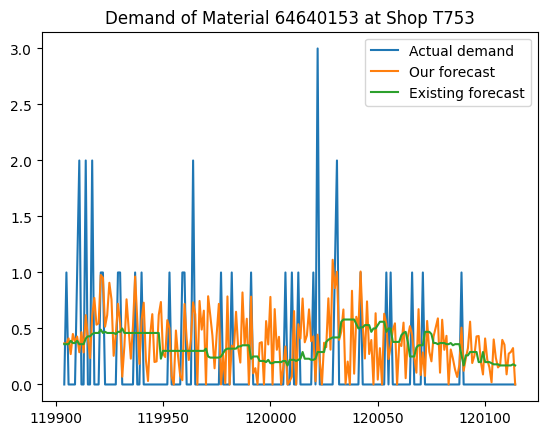

Material: 64640153
Shop: T754
AR 8 MA 8
Sum demand for this material: 3183.0


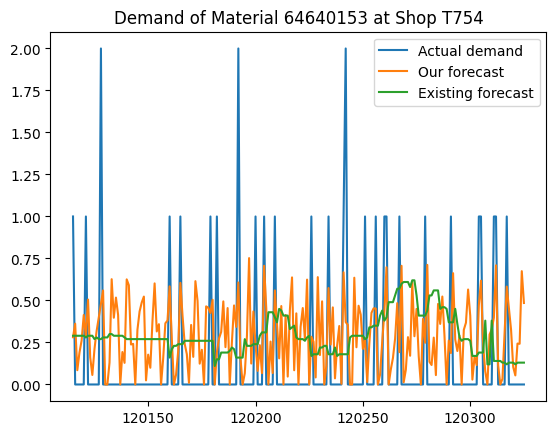

Material: 64640153
Shop: T760
AR 8 MA 8
Sum demand for this material: 3183.0


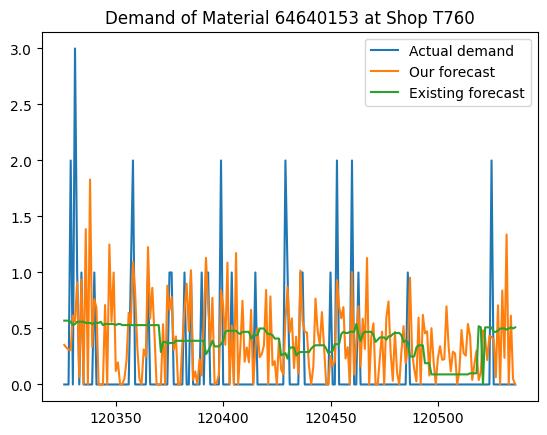

Material: 64640153
Shop: T772
AR 8 MA 8
Sum demand for this material: 3183.0


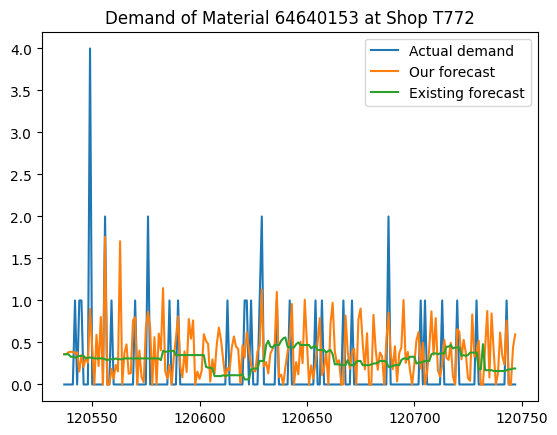

Material: 64640153
Shop: T780
AR 8 MA 8
Sum demand for this material: 3183.0


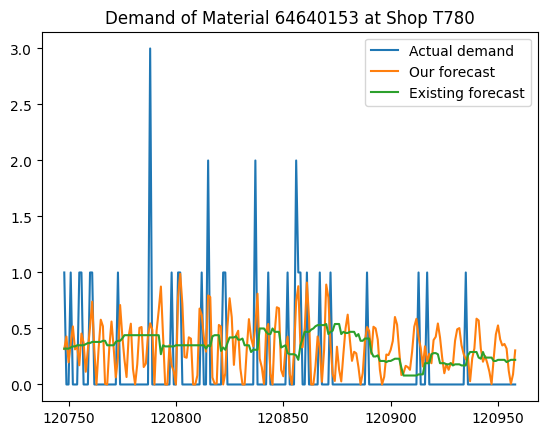

Material: 64640153
Shop: T782
AR 8 MA 8
Sum demand for this material: 3183.0


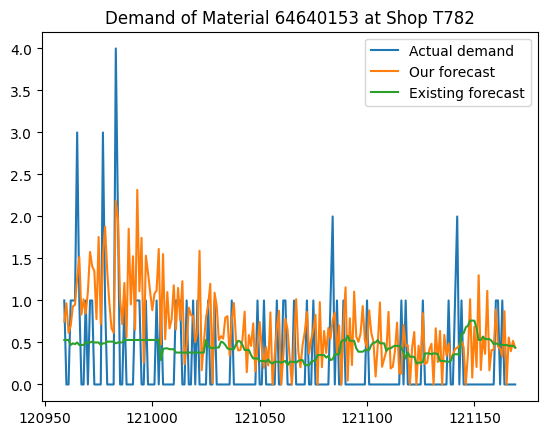

Material: 64640153
Shop: T790
AR 8 MA 8
Sum demand for this material: 3183.0


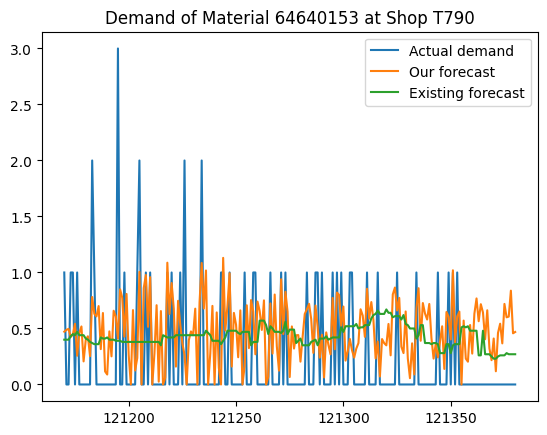

Material: 64640153
Shop: T791
AR 8 MA 8
Sum demand for this material: 3183.0


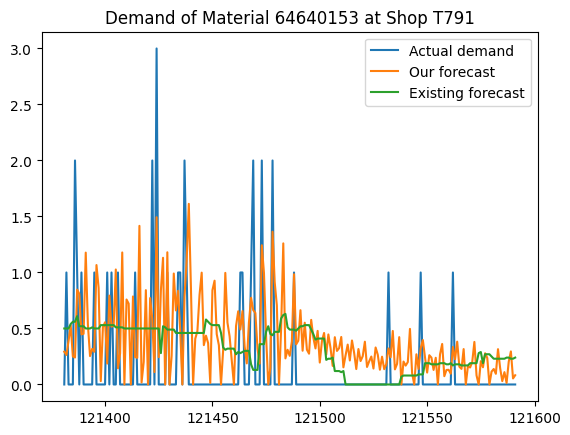

Material: 64640153
Shop: T792
AR 8 MA 8
Sum demand for this material: 3183.0


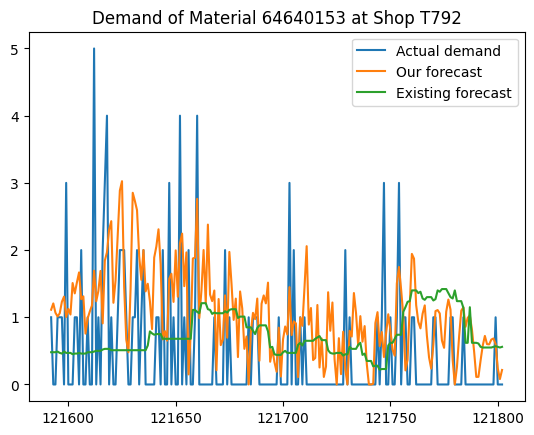

Material: 64640153
Shop: T794
AR 8 MA 8
Sum demand for this material: 3183.0


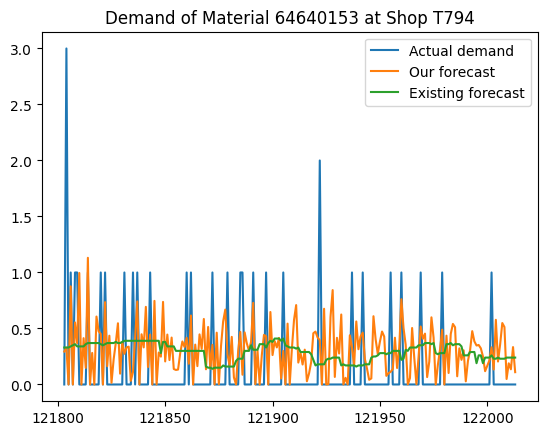

Material: 64640153
Shop: T942
AR 8 MA 8
Sum demand for this material: 3183.0


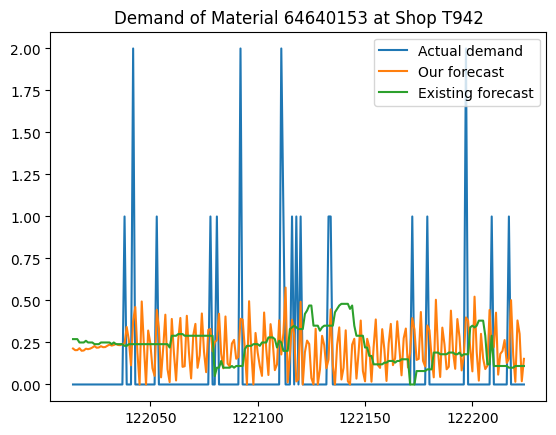

In [ ]:
plants = df_reset.Plant.unique()

material = 64640153

for m in [material]:
  df_spec = df_reset[df_reset.Material==m]
  df_param = df_parameter[df_parameter.Material==m]
  AR = df_param.AR.values[0]
  MA = df_param.MA.values[0]

  # Get sum demand for this material
  sum_demand = df_sum_demand.loc[m][0]

  for p in ['B319']:
    print('Material:', m)
    print('Shop:', p)
    print(f'AR {AR} MA {MA}')
    print('Sum demand for this material:', sum_demand)

    df_plant = df_spec[df_spec.Plant==p]

    # Look up contribution
    c_shop = (df_contribution.loc[p])[m]
    # print('Contribution value of this shop:', c_shop)

    # Genereta ARMA forecast for this material
    demand = df_plant.Demand

    try:
      model = ARIMA(demand, order=(AR,0,MA))
      arima = model.fit()

      timesteps = len(df_plant)
      forecast = arima.get_prediction(start=-timesteps)
      demand_forecast = forecast.predicted_mean
      demand_forecast[demand_forecast < 0] = 0 # set to 0 if forecast<0

    except:
      print("Error")
      demand_forecast = np.full(timesteps, np.nan)
      continue

    # # generate forecast shop wise
    # demand_forecast_shop = demand_forecast_original * c_shop * .1

    # sum_demand_shop = df_sum_shop.loc[m][p]
    demand_forecast_shop = demand_forecast * 2

    # Calculate RMSE
    rmse_exist_forecast = np.sqrt(mean_squared_error(demand, df_plant.Daily_forecast))
    rmse_our_forecast = np.sqrt(mean_squared_error(demand, demand_forecast_shop))

    plt.title(f'Demand of Material {m} at Shop {p}')
    plt.plot(demand, label='Actual demand')
    plt.plot(demand_forecast_shop, label=f'Our forecast')
    plt.plot(df_plant.Daily_forecast, label=f'Existing forecast')
    plt.legend()

    plt.show()

    # Add the demand_forecast_shop to df_reset as a new column
    df_reset.loc[(df_reset.Material == m) & (df_reset.Plant == p), 'Our Forecast'] = demand_forecast_shop


Material: 64640153
Shop: T412
AR 8 MA 8
Sum demand for this material: 3183.0


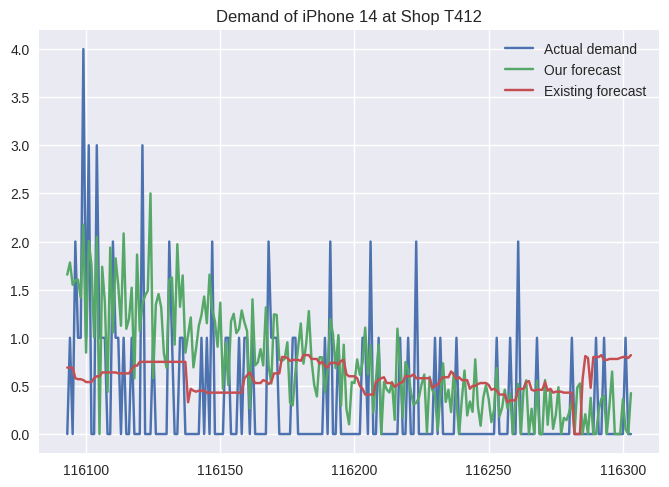

In [ ]:
plants = df_reset.Plant.unique()

material = 64640153

for m in [material]:
  df_spec = df_reset[df_reset.Material==m]
  df_param = df_parameter[df_parameter.Material==m]
  AR = df_param.AR.values[0]
  MA = df_param.MA.values[0]

  # Get sum demand for this material
  sum_demand = df_sum_demand.loc[m][0]

  for p in ['T412']:
    print('Material:', m)
    print('Shop:', p)
    print(f'AR {AR} MA {MA}')
    print('Sum demand for this material:', sum_demand)

    df_plant = df_spec[df_spec.Plant==p]

    # Look up contribution
    c_shop = (df_contribution.loc[p])[m]
    # print('Contribution value of this shop:', c_shop)

    # Genereta ARMA forecast for this material
    demand = df_plant.Demand

    try:
      model = ARIMA(demand, order=(AR,0,MA), exog=y)
      arima = model.fit()

      timesteps = len(df_plant)
      forecast = arima.get_prediction(start=-timesteps)
      demand_forecast = forecast.predicted_mean
      demand_forecast[demand_forecast < 0] = 0 # set to 0 if forecast<0

    except:
      print("Error")
      demand_forecast = np.full(timesteps, np.nan)
      continue

    # # generate forecast shop wise
    # demand_forecast_shop = demand_forecast_original * c_shop * .1

    # sum_demand_shop = df_sum_shop.loc[m][p]
    demand_forecast_shop = demand_forecast * 2

    # Calculate RMSE
    rmse_exist_forecast = np.sqrt(mean_squared_error(demand, df_plant.Daily_forecast))
    rmse_our_forecast = np.sqrt(mean_squared_error(demand, demand_forecast_shop))

    plt.title(f'Demand of iPhone 14 at Shop {p}')
    plt.plot(demand, label='Actual demand')
    plt.plot(demand_forecast_shop, label=f'Our forecast')
    plt.plot(df_plant.Daily_forecast, label=f'Existing forecast')
    plt.legend()

    plt.show()

    # Add the demand_forecast_shop to df_reset as a new column
    df_reset.loc[(df_reset.Material == m) & (df_reset.Plant == p), 'Our Forecast'] = demand_forecast_shop


Material: 62003310
Shop: T412
AR 7 MA 7
Sum demand for this material: 862.0


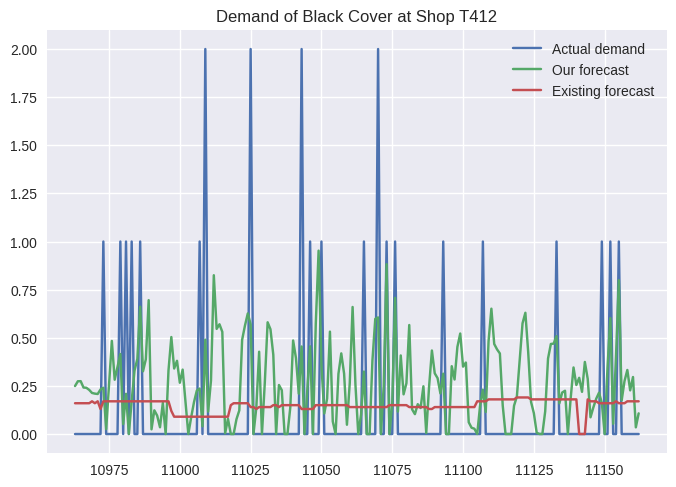

In [ ]:
plants = df_reset.Plant.unique()

material = 62003310

for m in [material]:
  df_spec = df_reset[df_reset.Material==m]
  df_param = df_parameter[df_parameter.Material==m]
  AR = df_param.AR.values[0]
  MA = df_param.MA.values[0]

  # Get sum demand for this material
  sum_demand = df_sum_demand.loc[m][0]

  for p in ['T412']:
    print('Material:', m)
    print('Shop:', p)
    print(f'AR {AR} MA {MA}')
    print('Sum demand for this material:', sum_demand)

    df_plant = df_spec[df_spec.Plant==p]

    # Look up contribution
    c_shop = (df_contribution.loc[p])[m]
    # print('Contribution value of this shop:', c_shop)

    # Genereta ARMA forecast for this material
    demand = df_plant.Demand

    try:
      model = ARIMA(demand, order=(AR,0,MA))
      arima = model.fit()

      timesteps = len(df_plant)
      forecast = arima.get_prediction(start=-timesteps)
      demand_forecast = forecast.predicted_mean
      demand_forecast[demand_forecast < 0] = 0 # set to 0 if forecast<0

    except:
      print("Error")
      demand_forecast = np.full(timesteps, np.nan)
      continue

    # # generate forecast shop wise
    # demand_forecast_shop = demand_forecast_original * c_shop * .1

    # sum_demand_shop = df_sum_shop.loc[m][p]
    demand_forecast_shop = demand_forecast * 2

    # Calculate RMSE
    rmse_exist_forecast = np.sqrt(mean_squared_error(demand, df_plant.Daily_forecast))
    rmse_our_forecast = np.sqrt(mean_squared_error(demand, demand_forecast_shop))

    plt.title(f'Demand of Black Cover at Shop {p}')
    plt.plot(demand, label='Actual demand')
    plt.plot(demand_forecast_shop, label=f'Our forecast')
    plt.plot(df_plant.Daily_forecast, label=f'Existing forecast')
    plt.legend()

    plt.show()

    # Add the demand_forecast_shop to df_reset as a new column
    df_reset.loc[(df_reset.Material == m) & (df_reset.Plant == p), 'Our Forecast'] = demand_forecast_shop


Material: 64641022
Shop: T410
AR 7 MA 0
Sum demand for this material: 768.0


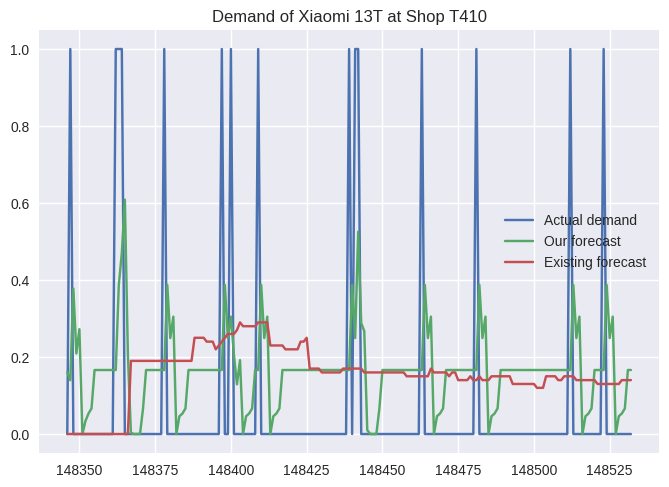

In [ ]:
plants = df_reset.Plant.unique()

material = 64641022

for m in [material]:
  df_spec = df_reset[df_reset.Material==m]
  df_param = df_parameter[df_parameter.Material==m]
  AR = df_param.AR.values[0]
  MA = df_param.MA.values[0]

  # Get sum demand for this material
  sum_demand = df_sum_demand.loc[m][0]

  for p in ['T410']:
    print('Material:', m)
    print('Shop:', p)
    print(f'AR {AR} MA {MA}')
    print('Sum demand for this material:', sum_demand)

    df_plant = df_spec[df_spec.Plant==p]

    # Look up contribution
    c_shop = (df_contribution.loc[p])[m]
    # print('Contribution value of this shop:', c_shop)

    # Genereta ARMA forecast for this material
    demand = df_plant.Demand

    try:
      model = ARIMA(demand, order=(AR,0,MA))
      arima = model.fit()

      timesteps = len(df_plant)
      forecast = arima.get_prediction(start=-timesteps)
      demand_forecast = forecast.predicted_mean
      demand_forecast[demand_forecast < 0] = 0 # set to 0 if forecast<0

    except:
      print("Error")
      demand_forecast = np.full(timesteps, np.nan)
      continue

    # # generate forecast shop wise
    # demand_forecast_shop = demand_forecast_original * c_shop * .1

    # sum_demand_shop = df_sum_shop.loc[m][p]
    demand_forecast_shop = demand_forecast * 2

    # Calculate RMSE
    rmse_exist_forecast = np.sqrt(mean_squared_error(demand, df_plant.Daily_forecast))
    rmse_our_forecast = np.sqrt(mean_squared_error(demand, demand_forecast_shop))

    plt.title(f'Demand of Xiaomi 13T at Shop {p}')
    plt.plot(demand, label='Actual demand')
    plt.plot(demand_forecast_shop, label=f'Our forecast')
    plt.plot(df_plant.Daily_forecast, label=f'Existing forecast')
    plt.legend()

    plt.show()

    # Add the demand_forecast_shop to df_reset as a new column
    df_reset.loc[(df_reset.Material == m) & (df_reset.Plant == p), 'Our Forecast'] = demand_forecast_shop


### Pick one product for presentation

In [28]:
from scipy.optimize import curve_fit

def c_t(x, p, q, m):
    return (p*m) + (q-p)*x - (q-m)*x**2

def bass_diffusion(c, p, q, m):
    return p*m + (q - p)*c - (q / m)*c**2

In [29]:
popt, pcov = curve_fit(c_t, result_df['Cumulative_64640153.0'][0:210], result_df['64640153.0'][1:211], maxfev=1000)
p_opt, q_opt, m_opt = popt

c=result_df['Cumulative_64640153.0']
demand=result_df['64640153.0']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

In [32]:
df_reset = df.reset_index()

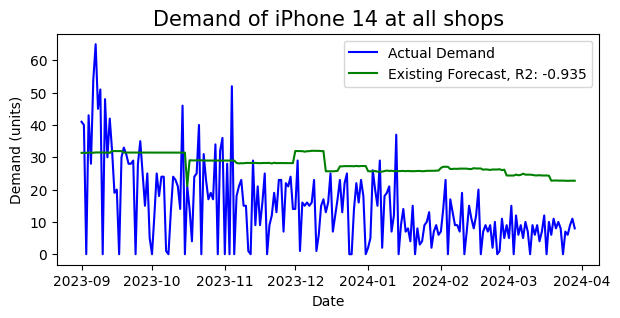

In [33]:
from sklearn.metrics import r2_score

df_iphone = df_reset[df_reset.Material==64640153]
demand_iphone = df_iphone.groupby('Date')['Demand'].sum()
act_forecast_iphone = df_iphone.groupby('Date')['Daily_forecast'].sum()

# generate forecast
# diffusion model
popt, pcov = curve_fit(c_t, result_df['Cumulative_64640153.0'][0:210], result_df['64640153.0'][1:211], maxfev=1000)
p_opt, q_opt, m_opt = popt

c=result_df['Cumulative_64640153.0']
demand=result_df['64640153.0']
c=np.linspace(0,1,211)
y=c_t(c,p_opt, q_opt, m_opt) * 3183 # sum demand of this material is this number

# arma
model = ARIMA(demand_iphone, order=(8,0,8), exog=y)
arima = model.fit()

steps = len(demand_iphone)
forecast = arima.get_prediction(start=-steps)
demand_forecast = forecast.predicted_mean
demand_forecast[demand_forecast < 0] = 0 # set to 0 if forecast<0

r2_act = r2_score(demand_iphone, act_forecast_iphone)
r2_our = r2_score(demand_iphone, demand_forecast)

plt.figure(figsize=(7,3))
plt.plot(demand_iphone.index, demand_iphone.values, c='blue', label='Actual Demand')
plt.plot(act_forecast_iphone.index, act_forecast_iphone.values, c='g', label=f'Existing Forecast, R2: {r2_act:.3f}')
# plt.plot(act_forecast_iphone.index, demand_forecast, c='r', label=f'Our Forecast, R2: {r2_our:.3f}')
# plt.plot(act_forecast_iphone.index, y, c='k', label='Diffusion curve')
plt.xlabel('Date'); plt.ylabel('Demand (units)')
plt.title('Demand of iPhone 14 at all shops', fontsize=15)

plt.legend()

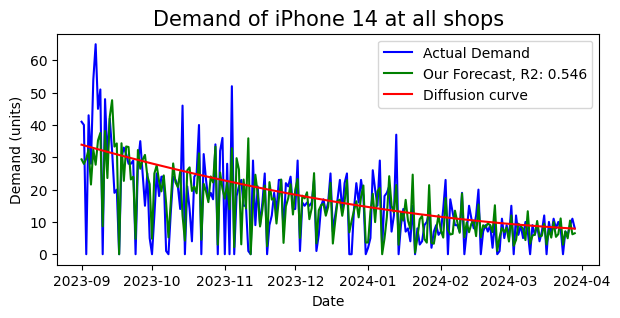

In [34]:
from sklearn.metrics import r2_score

df_iphone = df_reset[df_reset.Material==64640153]
demand_iphone = df_iphone.groupby('Date')['Demand'].sum()
act_forecast_iphone = df_iphone.groupby('Date')['Daily_forecast'].sum()

# generate forecast
# diffusion model
popt, pcov = curve_fit(c_t, result_df['Cumulative_64640153.0'][0:210], result_df['64640153.0'][1:211], maxfev=1000)
p_opt, q_opt, m_opt = popt

c=result_df['Cumulative_64640153.0']
demand=result_df['64640153.0']
c=np.linspace(0,1,211)
y=c_t(c,p_opt, q_opt, m_opt) * 3183 # sum demand of this material is this number

# arma
model = ARIMA(demand_iphone, order=(8,0,8), exog=y)
arima = model.fit()

steps = len(demand_iphone)
forecast = arima.get_prediction(start=-steps)
demand_forecast = forecast.predicted_mean
demand_forecast[demand_forecast < 0] = 0 # set to 0 if forecast<0

r2_act = r2_score(demand_iphone, act_forecast_iphone)
r2_our = r2_score(demand_iphone, demand_forecast)

plt.figure(figsize=(7,3))
plt.plot(demand_iphone.index, demand_iphone.values, c='blue', label='Actual Demand')
# plt.plot(act_forecast_iphone.index, act_forecast_iphone.values, c='g', label=f'Existing Forecast, R2: {r2_act:.3f}')
plt.plot(act_forecast_iphone.index, demand_forecast, c='g', label=f'Our Forecast, R2: {r2_our:.3f}')
plt.plot(act_forecast_iphone.index, y, c='r', label='Diffusion curve')
plt.xlabel('Date'); plt.ylabel('Demand (units)')
plt.title('Demand of iPhone 14 at all shops', fontsize=15)

plt.legend()

## Appendix 1. ARIMA model development

In [ ]:
from scipy.optimize import curve_fit

def c_t(x, p, q, m):
    return (p*m) + (q-p)*x - (q-m)*x**2

def bass_diffusion(c, p, q, m):
    return p*m + (q - p)*c - (q / m)*c**2

### Material 64639984.0

R^2: 0.1832822170206655


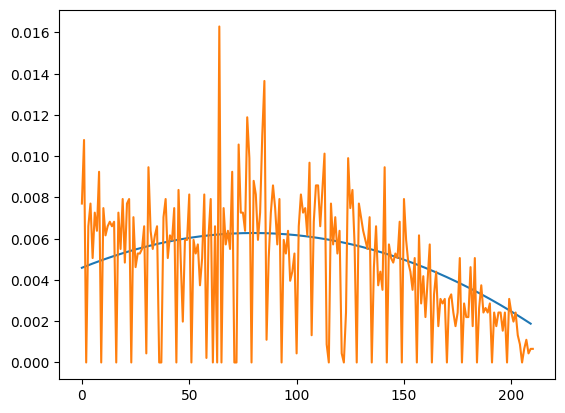

In [ ]:
popt, pcov = curve_fit(c_t, result_df['Cumulative_64639984.0'][0:210], result_df['64639984.0'][1:211], maxfev=1000)
p_opt, q_opt, m_opt = popt

c=result_df['Cumulative_64639984.0']
demand=result_df['64639984.0']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

plt.plot(y)
plt.plot(demand)

demand = demand[1:]

# Calculate the mean of the observed data
y_mean = np.mean(demand)

# Calculate the total sum of squares
ss_total = np.sum((demand - y_mean)**2)

# Calculate the sum of squares of residuals
ss_res = np.sum((demand - y)**2)

# Calculate R^2
r_squared = 1 - (ss_res / ss_total)

print("R^2:", r_squared)

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(demand, order=(7,0,7), exog=y)

arima = model.fit()

print(arima.summary())

                               SARIMAX Results                                
Dep. Variable:             64639984.0   No. Observations:                  210
Model:                 ARIMA(7, 0, 7)   Log Likelihood                 970.152
Date:                Wed, 10 Apr 2024   AIC                          -1908.304
Time:                        21:31:01   BIC                          -1854.750
Sample:                             0   HQIC                         -1886.654
                                - 210                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0046      0.001      6.869      0.000       0.003       0.006
ar.L1          0.0665      0.143      0.464      0.642      -0.214       0.347
ar.L2          0.1086      0.145      0.749      0.4

In [ ]:
# from statsmodels.tsa.arima.model import ARIMA

# model = ARIMA(residual, order=(7,0,7))

# arima = model.fit()

# print(arima.summary())

0.42242085600811186
0.0023973105641758095


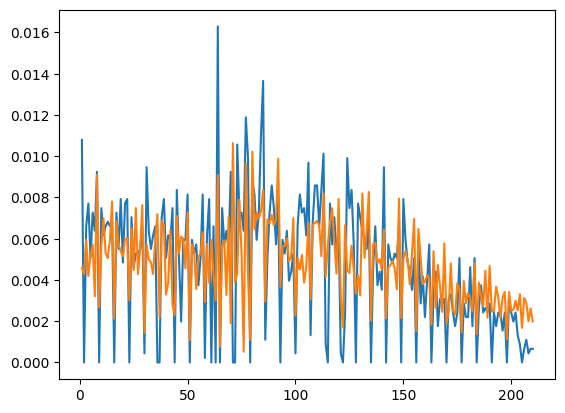

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

forecast = arima.get_prediction(start=-210)
demand_forecast = forecast.predicted_mean

print(r2_score(demand, demand_forecast))
print(np.sqrt(mean_squared_error(demand, demand_forecast)))

plt.plot(demand)
plt.plot(demand_forecast)

In [ ]:
# Predicted demand trend for next 60 days
c_pred = np.arange(1, 60, 1)
y_pred=c_t(c_pred,p_opt, q_opt, m_opt)


# forecast = arima.get_forecast(steps=60, exog)
# demand_forecast = forecast.predicted_mean

# plt.plot(demand_forecast)

y_pred

array([ 1.88094890e-03, -2.38787915e-02, -7.26884261e-02, -1.44547955e-01,
       -2.39457378e-01, -3.57416695e-01, -4.98425906e-01, -6.62485012e-01,
       -8.49594012e-01, -1.05975291e+00, -1.29296169e+00, -1.54922038e+00,
       -1.82852895e+00, -2.13088742e+00, -2.45629579e+00, -2.80475405e+00,
       -3.17626220e+00, -3.57082025e+00, -3.98842819e+00, -4.42908602e+00,
       -4.89279375e+00, -5.37955138e+00, -5.88935890e+00, -6.42221631e+00,
       -6.97812362e+00, -7.55708082e+00, -8.15908791e+00, -8.78414490e+00,
       -9.43225178e+00, -1.01034086e+01, -1.07976152e+01, -1.15148718e+01,
       -1.22551783e+01, -1.30185346e+01, -1.38049409e+01, -1.46143970e+01,
       -1.54469030e+01, -1.63024590e+01, -1.71810648e+01, -1.80827205e+01,
       -1.90074261e+01, -1.99551816e+01, -2.09259870e+01, -2.19198423e+01,
       -2.29367475e+01, -2.39767026e+01, -2.50397076e+01, -2.61257625e+01,
       -2.72348672e+01, -2.83670219e+01, -2.95222264e+01, -3.07004809e+01,
       -3.19017852e+01, -

### Material 64640000.0

R^2: 0.12366336215949791


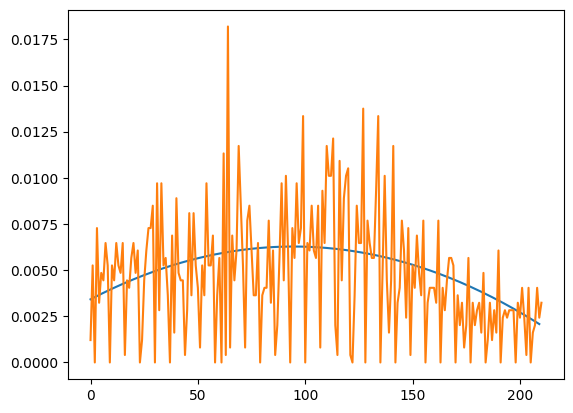

In [ ]:
popt, pcov = curve_fit(c_t, result_df['Cumulative_64640000.0'][0:210], result_df['64640000.0'][1:211], maxfev=1000)
p_opt, q_opt, m_opt = popt

c=result_df['Cumulative_64640000.0']
demand=result_df['64640000.0']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

plt.plot(y)
plt.plot(demand)

demand = demand[1:]

# Calculate the mean of the observed data
y_mean = np.mean(demand)

# Calculate the total sum of squares
ss_total = np.sum((demand - y_mean)**2)

# Calculate the sum of squares of residuals
ss_res = np.sum((demand - y)**2)

# Calculate R^2
r_squared = 1 - (ss_res / ss_total)

print("R^2:", r_squared)

In [ ]:
c=result_df['64640000.0']

# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-2
for p in range(10):
  # Loop over q values from 0-2
    for q in range(10):
      	# create and fit ARMA(p,q) model
        model = ARIMA(c, order=(p,0,q))
        results = model.fit()

        # Append order and results tuple
        order_aic_bic.append((p, q, results.aic, results.bic))

# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic,
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
print(order_df.sort_values(by='AIC'))

# Print order_df in order of increasing BIC
print(order_df.sort_values(by='BIC'))

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

    p  q          AIC          BIC
87  8  7 -1903.769192 -1846.787604
97  9  7 -1901.955985 -1841.622539
88  8  8 -1901.931377 -1841.597931
76  7  6 -1897.532570 -1847.254698
98  9  8 -1895.074537 -1831.389232
.. .. ..          ...          ...
32  3  2 -1796.177344 -1772.714337
42  4  2 -1794.177482 -1767.362617
43  4  3 -1792.177926 -1762.011203
53  5  3 -1790.178597 -1756.660016
63  6  3 -1788.178696 -1751.308257

[100 rows x 4 columns]
    p  q          AIC          BIC
80  8  0 -1881.502646 -1847.984065
76  7  6 -1897.532570 -1847.254698
87  8  7 -1903.769192 -1846.787604
70  7  0 -1874.912923 -1844.746200
71  7  1 -1877.684470 -1844.165889
.. .. ..          ...          ...
66  6  6 -1818.343966 -1771.417952
42  4  2 -1794.177482 -1767.362617
43  4  3 -1792.177926 -1762.011203
53  5  3 -1790.178597 -1756.660016
63  6  3 -1788.178696 -1751.308257

[100 rows x 4 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(demand, order=(8,0,7), exog=y)

arima = model.fit()

print(arima.summary())

                               SARIMAX Results                                
Dep. Variable:             64640000.0   No. Observations:                  210
Model:                 ARIMA(8, 0, 7)   Log Likelihood                 968.507
Date:                Tue, 09 Apr 2024   AIC                          -1901.014
Time:                        19:33:14   BIC                          -1840.766
Sample:                             0   HQIC                         -1876.658
                                - 210                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0006      0.001     -0.426      0.670      -0.004       0.002
x1             1.0750      0.269      3.999      0.000       0.548       1.602
ar.L1         -0.5808      0.184     -3.154      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


0.4777973405403815
0.0023967767481575465


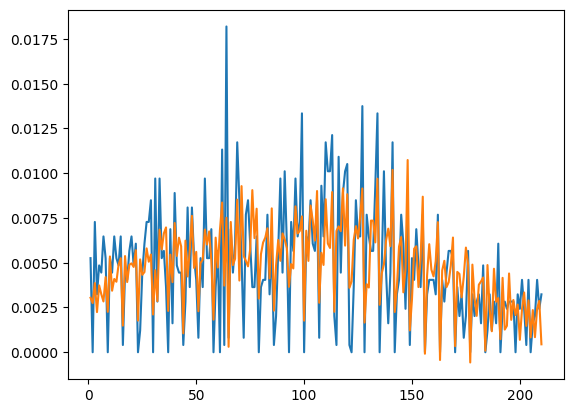

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

forecast = arima.get_prediction(start=-210)
demand_forecast = forecast.predicted_mean

print(r2_score(demand, demand_forecast))
print(np.sqrt(mean_squared_error(demand, demand_forecast)))

plt.plot(demand)
plt.plot(demand_forecast)

### Material 64640153.0

R^2: 0.20911120413040662


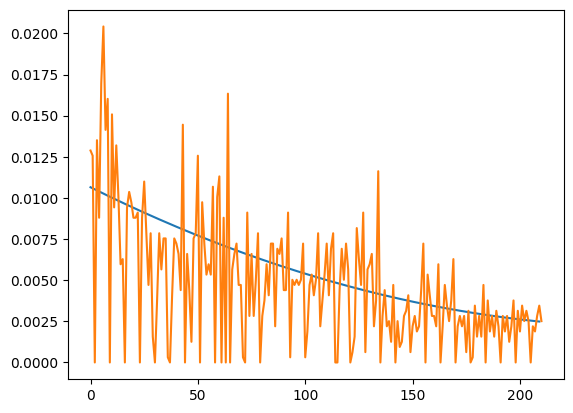

In [ ]:
popt, pcov = curve_fit(c_t, result_df['Cumulative_64640153.0'][0:210], result_df['64640153.0'][1:211], maxfev=1000)
p_opt, q_opt, m_opt = popt

c=result_df['Cumulative_64640153.0']
demand=result_df['64640153.0']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

plt.plot(y)
plt.plot(demand)

demand = demand[1:]

# Calculate the mean of the observed data
y_mean = np.mean(demand)

# Calculate the total sum of squares
ss_total = np.sum((demand - y_mean)**2)

# Calculate the sum of squares of residuals
ss_res = np.sum((demand - y)**2)

# Calculate R^2
r_squared = 1 - (ss_res / ss_total)

print("R^2:", r_squared)

In [ ]:
c=result_df['64640153.0']

# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-2
for p in range(10):
  # Loop over q values from 0-2
    for q in range(10):
      	# create and fit ARMA(p,q) model
        model = ARIMA(c, order=(p,0,q))
        results = model.fit()

        # Append order and results tuple
        order_aic_bic.append((p, q, results.aic, results.bic))

# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic,
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
print(order_df.sort_values(by='AIC'))

# Print order_df in order of increasing BIC
print(order_df.sort_values(by='BIC'))

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

    p  q          AIC          BIC
88  8  8 -1877.207198 -1816.873752
78  7  8 -1877.173805 -1820.192217
98  9  8 -1872.248741 -1808.563437
70  7  0 -1864.483342 -1834.316619
72  7  2 -1863.449467 -1826.579027
.. .. ..          ...          ...
5   0  5 -1763.037235 -1739.574228
2   0  2 -1760.575411 -1747.167978
10  1  0 -1749.880469 -1739.824895
1   0  1 -1745.125614 -1735.070040
0   0  0 -1741.789052 -1735.085336

[100 rows x 4 columns]
    p  q          AIC          BIC
70  7  0 -1864.483342 -1834.316619
80  8  0 -1862.032651 -1828.514069
71  7  1 -1861.385165 -1827.866584
72  7  2 -1863.449467 -1826.579027
81  8  1 -1860.724234 -1823.853794
.. .. ..          ...          ...
6   0  6 -1764.390638 -1737.575773
0   0  0 -1741.789052 -1735.085336
1   0  1 -1745.125614 -1735.070040
16  1  6 -1765.119268 -1734.952545
63  6  3 -1769.489683 -1732.619244

[100 rows x 4 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(demand, order=(8,0,8), exog=y)

arima = model.fit()

print(arima.summary())

                               SARIMAX Results                                
Dep. Variable:             64640153.0   No. Observations:                  210
Model:                 ARIMA(8, 0, 8)   Log Likelihood                 959.701
Date:                Thu, 11 Apr 2024   AIC                          -1881.402
Time:                        13:56:40   BIC                          -1817.807
Sample:                             0   HQIC                         -1855.693
                                - 210                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0001      0.001     -0.129      0.897      -0.002       0.002
x1             0.8590      0.139      6.196      0.000       0.587       1.131
ar.L1          0.2415      1.698      0.142      0.8

In [ ]:
df_iphone = df_reset[(df_reset.Material==64640153)][['Date', 'Daily_forecast']]

# df_iphone.groupby('Plant').Daily_forecast.sum() / 100
df_iphone

,Date,Daily_forecast
104543,2023-09-01,0.36
104544,2023-09-02,0.36
104545,2023-09-03,0.36
104546,2023-09-04,0.33
104547,2023-09-05,0.34
...,...,...
122220,2024-03-25,0.11
122221,2024-03-26,0.11
122222,2024-03-27,0.11
122223,2024-03-28,0.11


0.536053800851882
0.002610587240645339


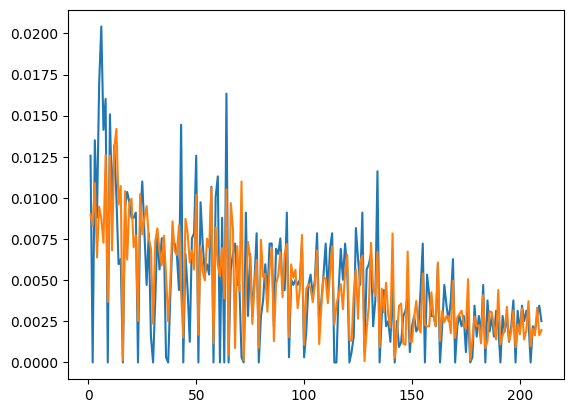

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

forecast = arima.get_prediction(start=-210)
demand_forecast = forecast.predicted_mean
existing_forecast =

print(r2_score(demand, demand_forecast))
print(np.sqrt(mean_squared_error(demand, demand_forecast)))

plt.plot(demand)
plt.plot(demand_forecast)

### Material 64640219.0

R^2: 0.055067102334122375


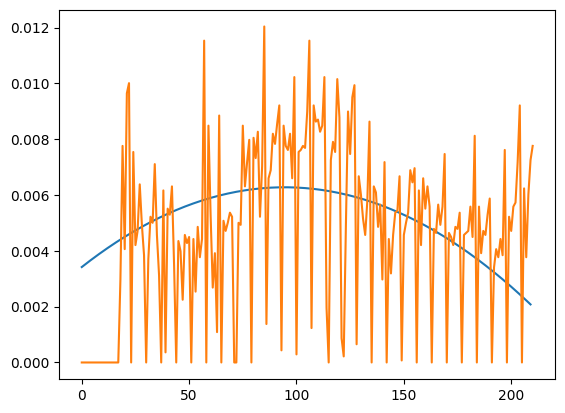

In [ ]:
c=result_df['Cumulative_64640219.0']
demand=result_df['64640219.0']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

plt.plot(y)
plt.plot(demand)

demand = demand[1:]

# Calculate the mean of the observed data
y_mean = np.mean(demand)

# Calculate the total sum of squares
ss_total = np.sum((demand - y_mean)**2)

# Calculate the sum of squares of residuals
ss_res = np.sum((demand - y)**2)

# Calculate R^2
r_squared = 1 - (ss_res / ss_total)

print("R^2:", r_squared)

In [ ]:
c=result_df['64640219.0']

# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-2
for p in range(10):
  # Loop over q values from 0-2
    for q in range(10):
      	# create and fit ARMA(p,q) model
        model = ARIMA(c, order=(p,0,q))
        results = model.fit()

        # Append order and results tuple
        order_aic_bic.append((p, q, results.aic, results.bic))

# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic,
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
print(order_df.sort_values(by='AIC'))

# Print order_df in order of increasing BIC
print(order_df.sort_values(by='BIC'))

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

    p  q          AIC          BIC
79  7  9 -1997.573579 -1937.240132
78  7  8 -1996.863962 -1939.882373
87  8  7 -1996.337546 -1939.355958
77  7  7 -1993.788658 -1940.158928
75  7  5 -1981.255605 -1934.329591
.. .. ..          ...          ...
46  4  6 -1845.986134 -1805.763836
36  3  6 -1845.587385 -1808.716946
10  1  0 -1843.731758 -1833.676183
1   0  1 -1840.002125 -1829.946551
0   0  0 -1836.974462 -1830.270746

[100 rows x 4 columns]
    p  q          AIC          BIC
90  9  0 -1980.849214 -1943.978775
80  8  0 -1975.475255 -1941.956673
70  7  0 -1971.313692 -1941.146968
71  7  1 -1973.849427 -1940.330845
77  7  7 -1993.788658 -1940.158928
.. .. ..          ...          ...
56  5  6 -1855.264301 -1811.690145
36  3  6 -1845.587385 -1808.716946
66  6  6 -1852.918368 -1805.992354
46  4  6 -1845.986134 -1805.763836
99  9  9 -1871.090338 -1804.053175

[100 rows x 4 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(demand, order=(7,0,9), exog=y)

arima = model.fit()

print(arima.summary())

                               SARIMAX Results                                
Dep. Variable:             64640219.0   No. Observations:                  210
Model:                 ARIMA(7, 0, 9)   Log Likelihood                1005.425
Date:                Tue, 09 Apr 2024   AIC                          -1972.850
Time:                        19:42:31   BIC                          -1909.255
Sample:                             0   HQIC                         -1947.141
                                - 210                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0010      0.002      0.401      0.689      -0.004       0.006
x1             0.7446      0.446      1.669      0.095      -0.130       1.619
ar.L1         -0.1061      0.080     -1.321      0.1

0.5555638178665421
0.0020494340631075983


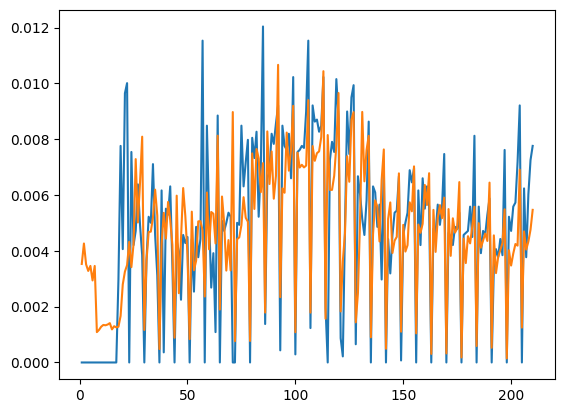

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

forecast = arima.get_prediction(start=-210)
demand_forecast = forecast.predicted_mean

print(r2_score(demand, demand_forecast))
print(np.sqrt(mean_squared_error(demand, demand_forecast)))

plt.plot(demand)
plt.plot(demand_forecast)

### Material 64641022.0

R^2: 0.10316452688274413


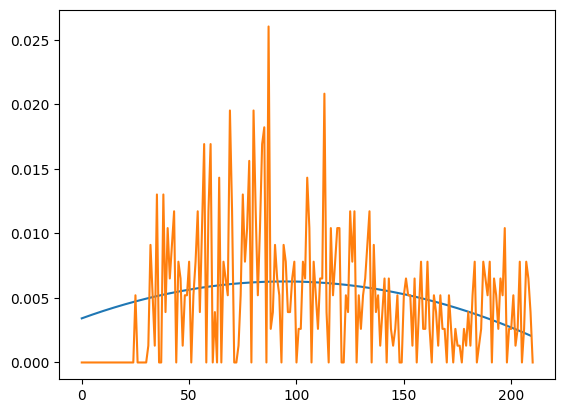

In [ ]:
c=result_df['Cumulative_64641022.0']
demand=result_df['64641022.0']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

plt.plot(y)
plt.plot(demand)

demand = demand[1:]

# Calculate the mean of the observed data
y_mean = np.mean(demand)

# Calculate the total sum of squares
ss_total = np.sum((demand - y_mean)**2)

# Calculate the sum of squares of residuals
ss_res = np.sum((demand - y)**2)

# Calculate R^2
r_squared = 1 - (ss_res / ss_total)

print("R^2:", r_squared)

In [ ]:
c=result_df['64641022.0']

# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-2
for p in range(10):
  # Loop over q values from 0-2
    for q in range(10):
      	# create and fit ARMA(p,q) model
        model = ARIMA(c, order=(p,0,q))
        results = model.fit()

        # Append order and results tuple
        order_aic_bic.append((p, q, results.aic, results.bic))

# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic,
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
print(order_df.sort_values(by='AIC'))

# Print order_df in order of increasing BIC
print(order_df.sort_values(by='BIC'))

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

    p  q          AIC          BIC
70  7  0 -1701.306212 -1671.139489
71  7  1 -1699.063925 -1665.545344
80  8  0 -1698.993072 -1665.474490
76  7  6 -1697.858255 -1647.580383
90  9  0 -1697.540108 -1660.669668
.. .. ..          ...          ...
2   0  2 -1648.639333 -1635.231900
10  1  0 -1647.696629 -1637.641055
1   0  1 -1645.452406 -1635.396831
11  1  1 -1644.914417 -1631.506984
0   0  0 -1644.572842 -1637.869126

[100 rows x 4 columns]
    p  q          AIC          BIC
70  7  0 -1701.306212 -1671.139489
71  7  1 -1699.063925 -1665.545344
80  8  0 -1698.993072 -1665.474490
90  9  0 -1697.540108 -1660.669668
81  8  1 -1697.173805 -1660.303365
.. .. ..          ...          ...
87  8  7 -1683.357697 -1626.376109
88  8  8 -1686.260310 -1625.926863
98  9  8 -1688.247903 -1624.562598
63  6  3 -1661.298944 -1624.428505
97  9  7 -1680.256196 -1619.922750

[100 rows x 4 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(demand, order=(7,0,0), exog=y)

arima = model.fit()

print(arima.summary())

                               SARIMAX Results                                
Dep. Variable:             64641022.0   No. Observations:                  210
Model:                 ARIMA(7, 0, 0)   Log Likelihood                 856.981
Date:                Tue, 09 Apr 2024   AIC                          -1693.963
Time:                        19:49:42   BIC                          -1660.492
Sample:                             0   HQIC                         -1680.432
                                - 210                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0028      0.004     -0.732      0.464      -0.010       0.005
x1             1.5047      0.686      2.195      0.028       0.161       2.849
ar.L1          0.0066      0.056      0.117      0.9

0.2976079820734018
0.004078478855029877


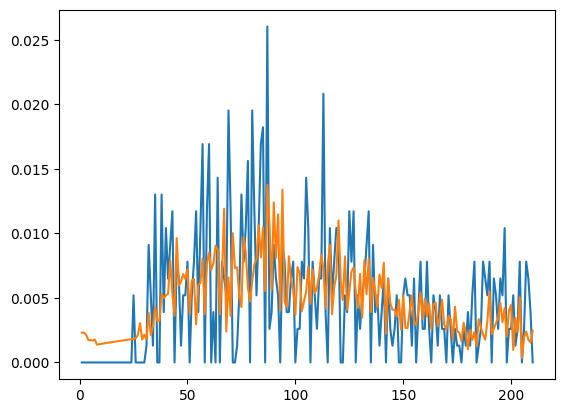

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

forecast = arima.get_prediction(start=-210)
demand_forecast = forecast.predicted_mean

print(r2_score(demand, demand_forecast))
print(np.sqrt(mean_squared_error(demand, demand_forecast)))

plt.plot(demand)
plt.plot(demand_forecast)

### Material 64639981 & 6463998

R^2: 0.12171527524835646


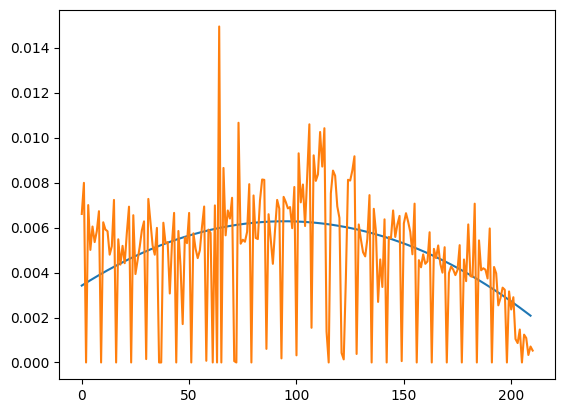

In [ ]:
c=result_df['Cumulative_Cluster 5_64639981_6463998']
demand=result_df['Cluster 5_64639981_6463998']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

plt.plot(y)
plt.plot(demand)

demand = demand[1:]

# Calculate the mean of the observed data
y_mean = np.mean(demand)

# Calculate the total sum of squares
ss_total = np.sum((demand - y_mean)**2)

# Calculate the sum of squares of residuals
ss_res = np.sum((demand - y)**2)

# Calculate R^2
r_squared = 1 - (ss_res / ss_total)

print("R^2:", r_squared)

In [ ]:
c=result_df['Cluster 5_64639981_6463998']

# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-2
for p in range(10):
  # Loop over q values from 0-2
    for q in range(10):
      	# create and fit ARMA(p,q) model
        model = ARIMA(c, order=(p,0,q))
        results = model.fit()

        # Append order and results tuple
        order_aic_bic.append((p, q, results.aic, results.bic))

# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic,
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
print(order_df.sort_values(by='AIC'))

# Print order_df in order of increasing BIC
print(order_df.sort_values(by='BIC'))

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

    p  q          AIC          BIC
79  7  9 -2017.311942 -1956.978496
78  7  8 -2016.646673 -1959.665085
75  7  5 -1994.695696 -1947.769682
76  7  6 -1993.636054 -1943.358182
70  7  0 -1988.469145 -1958.302422
.. .. ..          ...          ...
43  4  3 -1863.592604 -1833.425881
53  5  3 -1861.592788 -1828.074207
63  6  3 -1859.592801 -1822.722361
6   0  6 -1857.538478 -1830.723613
97  9  7 -1783.067308 -1722.733862

[100 rows x 4 columns]
    p  q          AIC          BIC
78  7  8 -2016.646673 -1959.665085
70  7  0 -1988.469145 -1958.302422
79  7  9 -2017.311942 -1956.978496
80  8  0 -1987.689090 -1954.170509
71  7  1 -1987.537467 -1954.018886
.. .. ..          ...          ...
6   0  6 -1857.538478 -1830.723613
53  5  3 -1861.592788 -1828.074207
63  6  3 -1859.592801 -1822.722361
88  8  8 -1865.399890 -1805.066443
97  9  7 -1783.067308 -1722.733862

[100 rows x 4 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(demand, order=(7,0,9), exog=y)

arima = model.fit()

print(arima.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                   SARIMAX Results                                    
Dep. Variable:     Cluster 5_64639981_6463998   No. Observations:                  210
Model:                         ARIMA(7, 0, 9)   Log Likelihood                 981.545
Date:                        Tue, 09 Apr 2024   AIC                          -1925.089
Time:                                19:55:14   BIC                          -1861.494
Sample:                                     0   HQIC                         -1899.380
                                        - 210                                         
Covariance Type:                          opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0003      0.002     -0.152      0.879      -0.004       0.003
x1             0.9271      0.328      2.827      0.005       0.284 

0.3560117298278944
0.002250941388096826


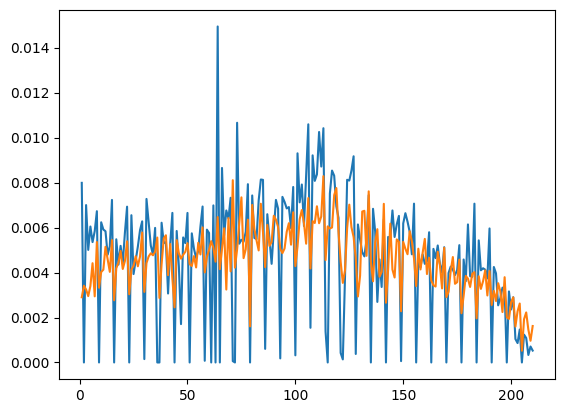

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

forecast = arima.get_prediction(start=-210)
demand_forecast = forecast.predicted_mean

print(r2_score(demand, demand_forecast))
print(np.sqrt(mean_squared_error(demand, demand_forecast)))

plt.plot(demand)
plt.plot(demand_forecast)

### Material 64639795.0

R^2: 0.009347991555637591


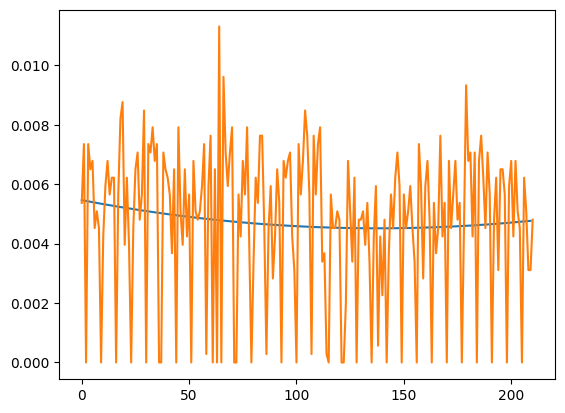

In [ ]:
popt, pcov = curve_fit(c_t, result_df['Cumulative_64639795.0'][0:210], result_df['64639795.0'][1:211], maxfev=1000)
p_opt, q_opt, m_opt = popt

c=result_df['Cumulative_64639795.0']
demand=result_df['64639795.0']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

plt.plot(y)
plt.plot(demand)

demand = demand[1:]

# Calculate the mean of the observed data
y_mean = np.mean(demand)

# Calculate the total sum of squares
ss_total = np.sum((demand - y_mean)**2)

# Calculate the sum of squares of residuals
ss_res = np.sum((demand - y)**2)

# Calculate R^2
r_squared = 1 - (ss_res / ss_total)

print("R^2:", r_squared)

In [ ]:
c=result_df['64639795.0']

# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-2
for p in range(10):
  # Loop over q values from 0-2
    for q in range(10):
      	# create and fit ARMA(p,q) model
        model = ARIMA(c, order=(p,0,q))
        results = model.fit()

        # Append order and results tuple
        order_aic_bic.append((p, q, results.aic, results.bic))

# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic,
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
print(order_df.sort_values(by='AIC'))

# Print order_df in order of increasing BIC
print(order_df.sort_values(by='BIC'))

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

    p  q          AIC          BIC
77  7  7 -2015.368997 -1961.739267
78  7  8 -2004.798765 -1947.817177
90  9  0 -1999.539066 -1962.668627
75  7  5 -1998.548619 -1951.622605
76  7  6 -1998.385538 -1948.107666
.. .. ..          ...          ...
4   0  4 -1902.866311 -1882.755162
43  4  3 -1901.909576 -1871.742853
14  1  4 -1900.919135 -1877.456128
44  4  4 -1892.513614 -1858.995033
24  2  4 -1886.426058 -1859.611193

[100 rows x 4 columns]
    p  q          AIC          BIC
70  7  0 -1995.766859 -1965.600136
90  9  0 -1999.539066 -1962.668627
77  7  7 -2015.368997 -1961.739267
80  8  0 -1993.954390 -1960.435809
71  7  1 -1993.727185 -1960.208604
.. .. ..          ...          ...
63  6  3 -1909.225493 -1872.355053
43  4  3 -1901.909576 -1871.742853
87  8  7 -1921.209074 -1864.227486
24  2  4 -1886.426058 -1859.611193
44  4  4 -1892.513614 -1858.995033

[100 rows x 4 columns]


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(demand, order=(7,0,7), exog=y)

arima = model.fit()

print(arima.summary())

NameError: name 'demand' is not defined

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

forecast = arima.get_prediction(start=-210)
demand_forecast = forecast.predicted_mean

print(r2_score(demand, demand_forecast))
print(np.sqrt(mean_squared_error(demand, demand_forecast)))

plt.plot(demand)
plt.plot(demand_forecast)

### Material 62003310.0

R^2: 0.029912851252460237


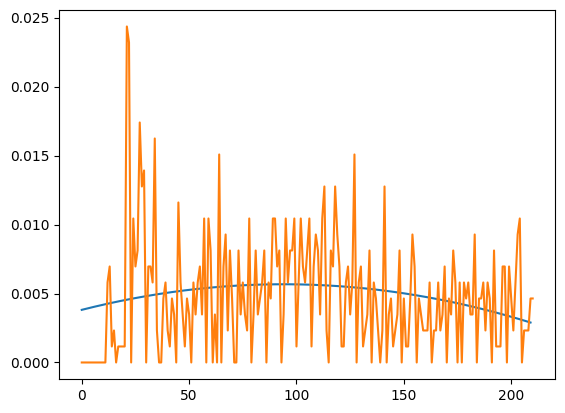

In [ ]:
popt, pcov = curve_fit(c_t, result_df['Cumulative_62003310.0'][0:210], result_df['62003310.0'][1:211], maxfev=1000)
p_opt, q_opt, m_opt = popt

c=result_df['Cumulative_62003310.0']
demand=result_df['62003310.0']
c=np.linspace(0,1,210)
y=c_t(c,p_opt, q_opt, m_opt)

plt.plot(y)
plt.plot(demand)

demand = demand[1:]

# Calculate the mean of the observed data
y_mean = np.mean(demand)

# Calculate the total sum of squares
ss_total = np.sum((demand - y_mean)**2)

# Calculate the sum of squares of residuals
ss_res = np.sum((demand - y)**2)

# Calculate R^2
r_squared = 1 - (ss_res / ss_total)

print("R^2:", r_squared)

In [ ]:
c=result_df['62003310.0']

# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-2
for p in range(10):
  # Loop over q values from 0-2
    for q in range(10):
      	# create and fit ARMA(p,q) model
        model = ARIMA(c, order=(p,0,q))
        results = model.fit()

        # Append order and results tuple
        order_aic_bic.append((p, q, results.aic, results.bic))

# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic,
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
print(order_df.sort_values(by='AIC'))

# Print order_df in order of increasing BIC
print(order_df.sort_values(by='BIC'))

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

    p  q          AIC          BIC
77  7  7 -1754.432768 -1700.803038
76  7  6 -1752.793441 -1702.515569
86  8  6 -1749.006616 -1695.376886
78  7  8 -1743.648513 -1686.666924
80  8  0 -1743.211328 -1709.692747
.. .. ..          ...          ...
43  4  3 -1697.267251 -1667.100527
12  1  2 -1697.067794 -1680.308504
21  2  1 -1696.982560 -1680.223270
22  2  2 -1694.982577 -1674.871428
23  2  3 -1692.982510 -1669.519503

[100 rows x 4 columns]
    p  q          AIC          BIC
80  8  0 -1743.211328 -1709.692747
70  7  0 -1739.633304 -1709.466581
71  7  1 -1742.631512 -1709.112931
7   0  7 -1737.081401 -1706.914678
90  9  0 -1741.421015 -1704.550576
.. .. ..          ...          ...
65  6  5 -1707.968088 -1664.393932
89  8  9 -1727.118584 -1663.433279
98  9  8 -1725.265291 -1661.579986
99  9  9 -1725.243002 -1658.205840
96  9  6 -1698.511871 -1641.530283

[100 rows x 4 columns]


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(demand, order=(7,0,7), exog=y)

arima = model.fit()

print(arima.summary())

                               SARIMAX Results                                
Dep. Variable:             62003310.0   No. Observations:                  210
Model:                 ARIMA(7, 0, 7)   Log Likelihood                 890.995
Date:                Wed, 10 Apr 2024   AIC                          -1747.990
Time:                        20:05:58   BIC                          -1691.089
Sample:                             0   HQIC                         -1724.987
                                - 210                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0005      0.005     -0.109      0.913      -0.010       0.009
x1             1.0070      0.937      1.074      0.283      -0.830       2.845
ar.L1         -0.2172      0.151     -1.440      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


0.32587692425541404
0.0034765852673923963


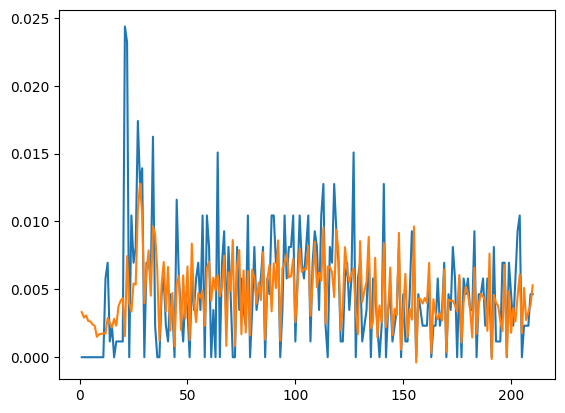

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

forecast = arima.get_prediction(start=-210)
demand_forecast = forecast.predicted_mean

print(r2_score(demand, demand_forecast))
print(np.sqrt(mean_squared_error(demand, demand_forecast)))

plt.plot(demand)
plt.plot(demand_forecast)

## Appendix 2. Other Clustering method e.g. Association mining

In [ ]:
def encode(item_freq):
    res = 0
    if item_freq > 0:
        res = 1
    return res

basket_input = dfx.applymap(encode)

basket_input

Material   62003310                                               ...  \
Plant          B124 B238 B319 B420 B534 B536 T101 T102 T103 T105  ...   
Date                                                              ...   
2023-09-01        0    0    0    0    0    0    0    0    0    0  ...   
2023-09-02        0    0    0    0    0    0    0    0    0    0  ...   
2023-09-03        0    0    0    0    0    0    0    0    0    0  ...   
2023-09-04        0    0    0    0    0    0    0    0    0    0  ...   
2023-09-05        0    0    0    0    0    0    0    0    0    0  ...   
...             ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
2024-03-25        0    0    0    0    0    0    0    0    0    0  ...   
2024-03-26        0    0    0    0    0    0    0    0    0    0  ...   
2024-03-27        0    0    0    0    0    0    0    0    0    0  ...   
2024-03-28        0    0    0    0    1    0    0    0    0    0  ...   
2024-03-29        0    0    0    0    0    0    0    0    0    0  ...   

Material   64641022                                               
Plant          T754 T760 T772 T780 T782 T790 T791 T792 T794 T942  
Date                                                              
2023-09-01        0    0    0    0    0    0    0    0    0    0  
2023-09-02        0    0    0    0    0    0    0    0    0    0  
2023-09-03        0    0    0    0    0    0    0    0    0    0  
2023-09-04        0    0    0    0    0    0    0    0    0    0  
2023-09-05        0    0    0    0    0    0    0    0    0    0  
...             ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  
2024-03-25        0    0    0    0    0    0    0    0    0    0  
2024-03-26        0    0    0    0    0    0    0    0    0    0  
2024-03-27        0    0    0    0    0    0    0    0    0    0  
2024-03-28        0    0    0    0    0    0    0    0    0    0  
2024-03-29        0    0    0    0    0    0    0    0    0    0  

[211 rows x 792 columns]

In [ ]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

frequent_itemsets = apriori(basket_input, min_support=0.3, use_colnames=True)

rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)

rules2 = rules.sort_values(["lift"],axis = 0, ascending = False)

rules2

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
356669,"((64640219, T792), (64640219, T125))","((64640219, T407), (64640219, T760), (64640219...",0.436019,0.383886,0.303318,0.695652,1.812131,0.135936,2.024374,0.794643
356636,"((64640219, T407), (64640219, T760), (64640219...","((64640219, T792), (64640219, T125))",0.383886,0.436019,0.303318,0.790123,1.812131,0.135936,2.687204,0.727404
125543,"((64640219, T407), (64640219, T412), (64640219...","((64639988, B238), (64640219, T318))",0.445498,0.379147,0.303318,0.680851,1.795745,0.134408,1.945340,0.799145
125558,"((64639988, B238), (64640219, T318))","((64640219, T407), (64640219, T412), (64640219...",0.379147,0.445498,0.303318,0.800000,1.795745,0.134408,2.772512,0.713740
125648,"((64639988, B238), (64640219, T792))","((64640219, T407), (64640219, T412), (64640219...",0.398104,0.445498,0.317536,0.797619,1.790400,0.140181,2.739894,0.733459
...,...,...,...,...,...,...,...,...,...,...
295,"((64640219, T318))","((64639981, T724))",0.654028,0.497630,0.336493,0.514493,1.033885,0.011029,1.034732,0.094733
1360,"((64640219, T413))","((64639988, T724))",0.554502,0.530806,0.303318,0.547009,1.030525,0.008985,1.035769,0.066489
1361,"((64639988, T724))","((64640219, T413))",0.530806,0.554502,0.303318,0.571429,1.030525,0.008985,1.039494,0.063131
3685,"((64639981, T724))","((64640219, T412), (64640219, T318))",0.497630,0.606635,0.308057,0.619048,1.020461,0.006177,1.032583,0.039913


In [ ]:
import pandas as pd

def find_unique_mutually_exclusive_pairs(df, antecedent_col, consequent_col):
  """
  Finds unique and mutually exclusive antecedent-consequent pairs from a DataFrame.

  Args:
      df (pd.DataFrame): Input DataFrame containing antecedent and consequent columns.
      antecedent_col (str): Name of the column containing antecedent frozensets.
      consequent_col (str): Name of the column containing consequent frozensets.

  Returns:
      list: List of tuples representing unique and mutually exclusive pairs.
  """

  unique_pairs = []
  seen_antecedents = set()

  for index, row in df.iterrows():
    antecedent = row[antecedent_col]
    consequent = row[consequent_col]

    if antecedent not in seen_antecedents:
      is_mutually_exclusive = True
      for other_antecedent, _ in unique_pairs:
        if antecedent.issubset(other_antecedent) or other_antecedent.issubset(antecedent):
          is_mutually_exclusive = False
          break

      if is_mutually_exclusive:
        unique_pairs.append((antecedent, consequent))
        seen_antecedents.add(antecedent)

  return unique_pairs

# Example usage (assuming your DataFrame is called 'df')
unique_pairs = find_unique_mutually_exclusive_pairs(rules2, 'antecedents', 'consequents')
print(unique_pairs)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(frozenset({(64640219, 'T125'), (64640219, 'T792')}), frozenset({(64640219, 'T407'), (64640219, 'T527'), (64640219, 'T234'), (64640219, 'T760')})), (frozenset({(64640219, 'T407'), (64640219, 'T527'), (64640219, 'T234'), (64640219, 'T760')}), frozenset({(64640219, 'T125'), (64640219, 'T792')})), (frozenset({(64640219, 'B319'), (64640219, 'T407'), (64640219, 'T412')}), frozenset({(64639988, 'B238'), (64640219, 'T318')})), (frozenset({(64639988, 'B238'), (64640219, 'T318')}), frozenset({(64640219, 'B319'), (64640219, 'T407'), (64640219, 'T412')})), (frozenset({(64639988, 'B238'), (64640219, 'T792')}), frozenset({(64640219, 'B319'), (64640219, 'T407'), (64640219, 'T412')})), (frozenset({(64640219, 'B319'), (64640219, 'T529'), (64640219, 'T407')}), frozenset({(64640219, 'T782'), (64640219, 'T410'), (64640219, 'T318')})), (frozenset({(64640219, 'T782'), (64640219, 'T410'), (64640219, 'T318')}), frozenset({(64640219, 'B319'), (64640219, 'T529'), (64640219, 'T407')})), (frozenset({(64640219, 

In [ ]:
rules2.iloc[:500,:].to_csv('Vlerick_cluster.csv', index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df_pivot = df_assoc.pivot_table(index='Date', columns='Material', values='Demand', aggfunc='sum')

df_pivot

Material,62003310,64639795,64639981,64639984,64639988,64640000,64640153,64640219,64641022
Date,,,,,,,,,
2023-09-01,NaN,19.0,53.0,35.0,43.0,3.0,41.0,NaN,NaN
2023-09-02,NaN,26.0,44.0,49.0,77.0,13.0,40.0,NaN,NaN
2023-09-03,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2023-09-04,NaN,26.0,51.0,30.0,52.0,18.0,43.0,NaN,NaN
2023-09-05,NaN,23.0,31.0,35.0,44.0,8.0,28.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2024-03-25,2.0,22.0,14.0,3.0,3.0,4.0,7.0,86.0,2.0
2024-03-26,2.0,18.0,12.0,5.0,3.0,5.0,6.0,52.0,6.0
2024-03-27,2.0,11.0,2.0,2.0,3.0,10.0,9.0,83.0,5.0


In [ ]:
# Convert the index to datetime if it's not already
df_assoc_pivot.index = pd.to_datetime(df_assoc_pivot.index)

# Resample the DataFrame on a monthly basis and calculate the mean
monthly_avg_demand = df_assoc_pivot.resample('W').mean()

monthly_avg_demand

Material,62003310,64639795,64639981,64639984,64639988,64640000,64640153,64640219,64641022
Date,,,,,,,,,
2023-09-03,NaN,15.000000,32.333333,28.000000,40.000000,5.333333,27.000000,NaN,NaN
2023-09-10,NaN,17.571429,35.285714,27.428571,40.857143,11.142857,40.857143,NaN,NaN
2023-09-17,2.333333,17.714286,32.857143,26.285714,42.000000,11.714286,27.285714,NaN,NaN
2023-09-24,6.428571,18.571429,29.857143,26.714286,38.571429,11.142857,25.571429,79.166667,NaN
2023-10-01,8.571429,18.714286,30.857143,22.571429,38.142857,12.285714,19.000000,62.285714,0.571429
2023-10-08,4.714286,18.428571,31.142857,22.142857,30.714286,13.000000,14.857143,56.571429,3.285714
2023-10-15,2.714286,18.000000,34.285714,25.714286,32.428571,11.142857,20.142857,53.428571,6.000000
2023-10-22,3.714286,16.857143,34.571429,23.000000,26.142857,11.571429,18.285714,47.142857,3.714286
2023-10-29,4.428571,17.857143,40.571429,22.142857,28.428571,12.714286,20.142857,62.142857,6.142857


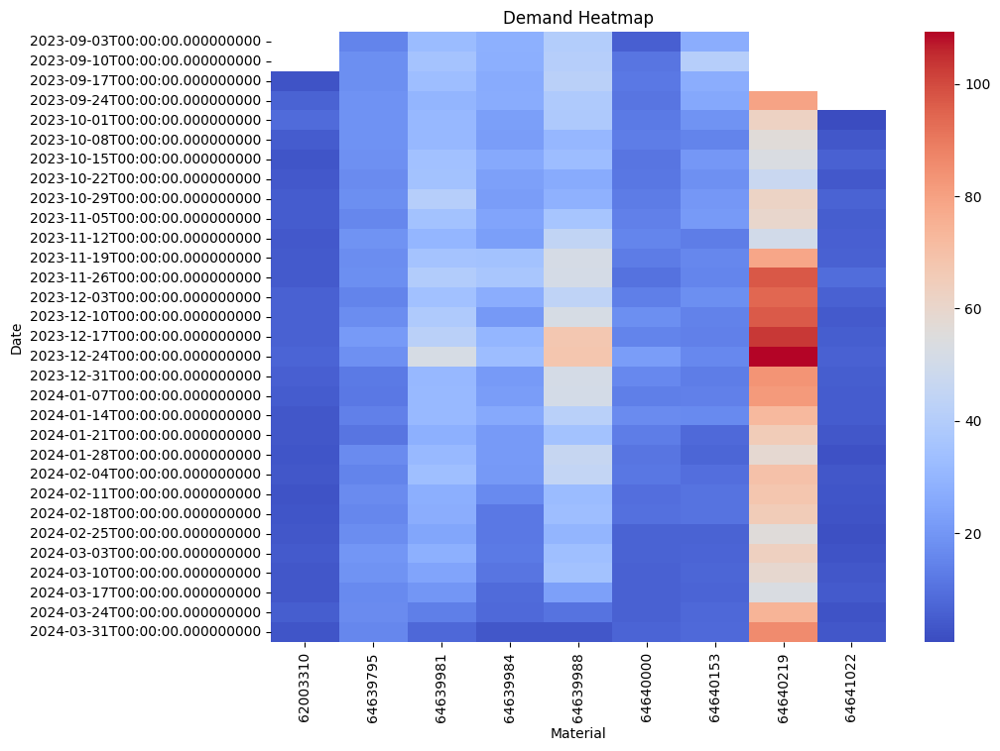

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 8))  # Set the size of the heatmap
sns.heatmap(monthly_avg_demand, cmap='coolwarm')  # Create the heatmap using the 'coolwarm' colormap
plt.title('Demand Heatmap')  # Set the title of the heatmap
plt.xlabel('Material')  # Set the label for the x-axis
plt.ylabel('Date')  # Set the label for the y-axis
plt.show()  # Show the heatmap

In [ ]:
df.reset_index().to_csv('Vlerick.csv')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df.index.levels[-1].freq = 'D'

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  # TODO: this should check every case for "are we inside the runner",


In [ ]:
materials = df.index.levels[0].values
plants = df.index.levels[1].values
dates = df.index.levels[2].values

print('Materials:', materials)
print('Plants:', plants)
print('Min Date:', dates.min())
print('Max Date:', dates.max())



Materials: [62003310 64639795 64639981 64639984 64639988 64640000 64640153 64640219
 64641022]
Plants: ['B124' 'B238' 'B319' 'B420' 'B534' 'B536' 'T101' 'T102' 'T103' 'T105'
 'T107' 'T110' 'T111' 'T113' 'T114' 'T115' 'T120' 'T125' 'T126' 'T127'
 'T128' 'T129' 'T146' 'T149' 'T201' 'T202' 'T204' 'T205' 'T206' 'T207'
 'T209' 'T210' 'T213' 'T215' 'T216' 'T220' 'T223' 'T232' 'T233' 'T234'
 'T237' 'T238' 'T301' 'T302' 'T303' 'T304' 'T305' 'T311' 'T315' 'T316'
 'T317' 'T318' 'T325' 'T348' 'T403' 'T407' 'T410' 'T411' 'T412' 'T413'
 'T415' 'T504' 'T507' 'T508' 'T509' 'T510' 'T513' 'T517' 'T518' 'T520'
 'T527' 'T529' 'T531' 'T724' 'T734' 'T743' 'T751' 'T753' 'T754' 'T760'
 'T772' 'T780' 'T782' 'T790' 'T791' 'T792' 'T794' 'T942']
Min Date: 2023-09-01T00:00:00.000000000
Max Date: 2024-03-29T00:00:00.000000000


---